# GUC Clustering Project 

In [1]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [2]:
!pip install plotnine

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [2]:
# if plotnine is not installed in Jupter then use the following command to install it 


Running this project require the following imports 

In [4]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



(1450, 2)


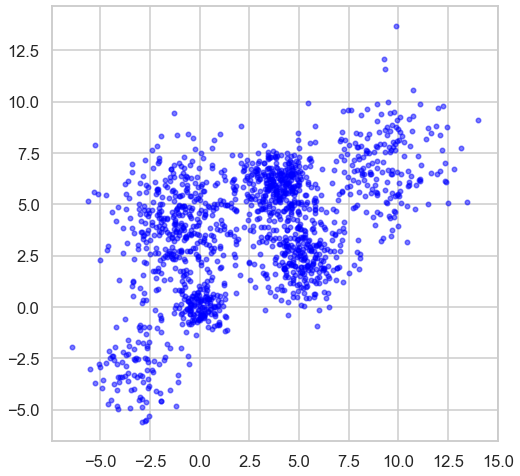

In [5]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
num_classes = len(centers)
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
print(Multi_blob_Data.shape)

display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

For n_clusters = 2 The average silhouette_score is : 0.4751544541991239
For n_clusters = 3 The average silhouette_score is : 0.43631793714185435
For n_clusters = 4 The average silhouette_score is : 0.4628725400351352
For n_clusters = 5 The average silhouette_score is : 0.48092962827116337
For n_clusters = 6 The average silhouette_score is : 0.4859737366910219
For n_clusters = 7 The average silhouette_score is : 0.463222898064336
For n_clusters = 8 The average silhouette_score is : 0.4446095767455456
For n_clusters = 9 The average silhouette_score is : 0.43981487556590904
For n_clusters = 10 The average silhouette_score is : 0.3913954630668706
For n_clusters = 11 The average silhouette_score is : 0.4006111635311462
For n_clusters = 12 The average silhouette_score is : 0.36979691062224884
For n_clusters = 13 The average silhouette_score is : 0.390559498780125
For n_clusters = 14 The average silhouette_score is : 0.3707755406105061
For n_clusters = 15 The average silhouette_score is : 0.3

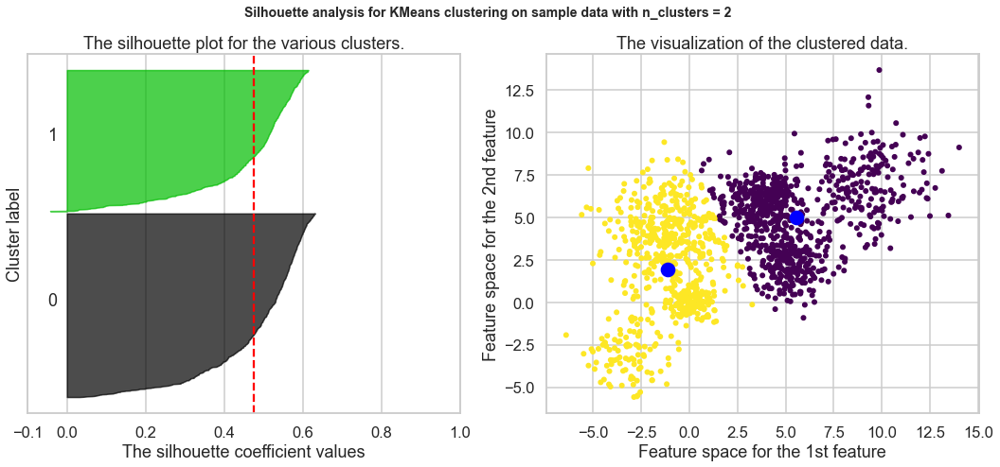

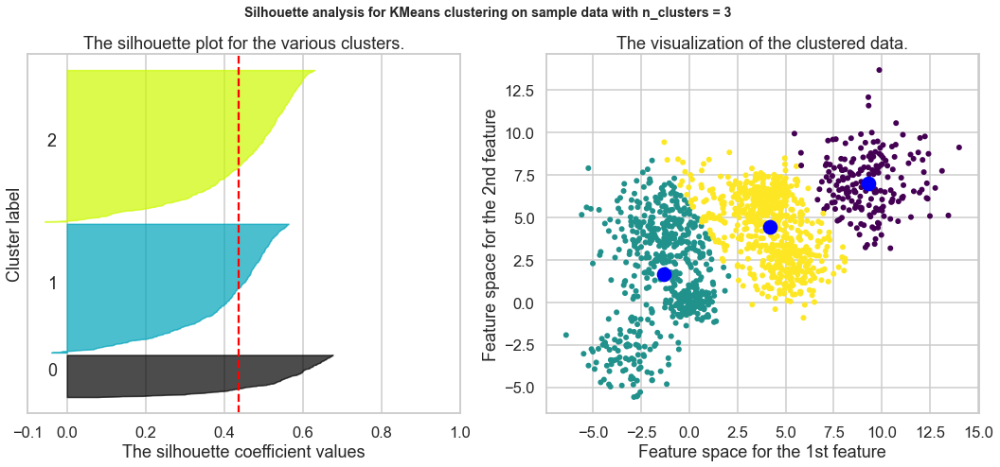

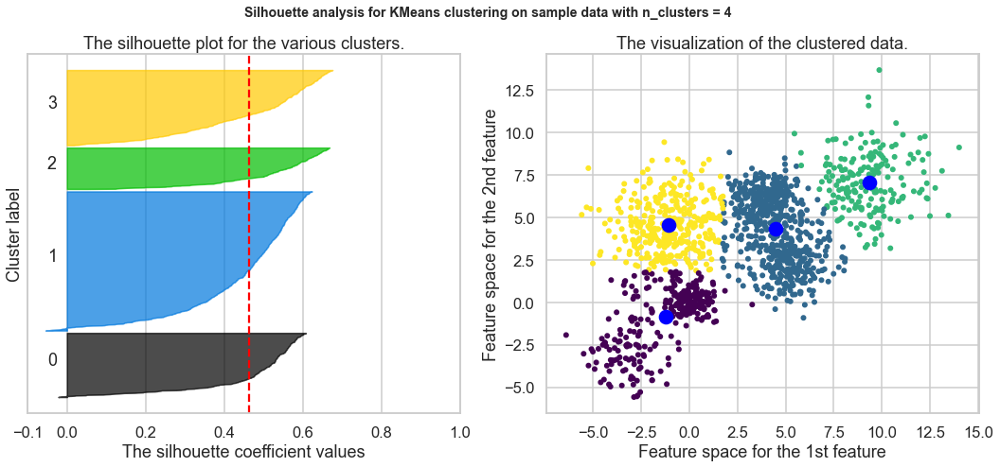

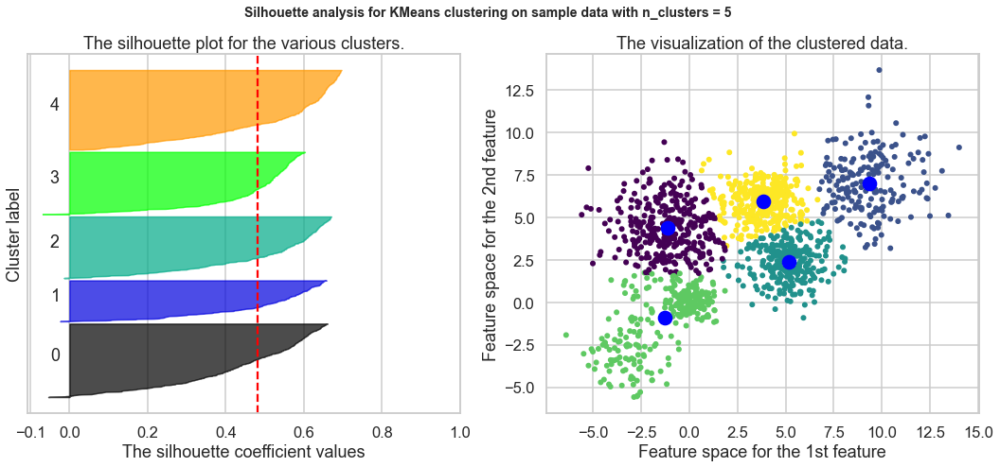

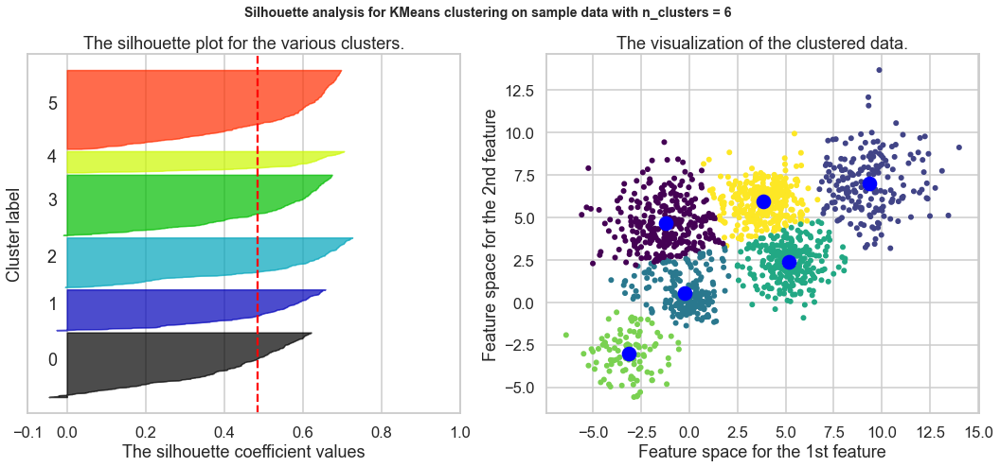

...

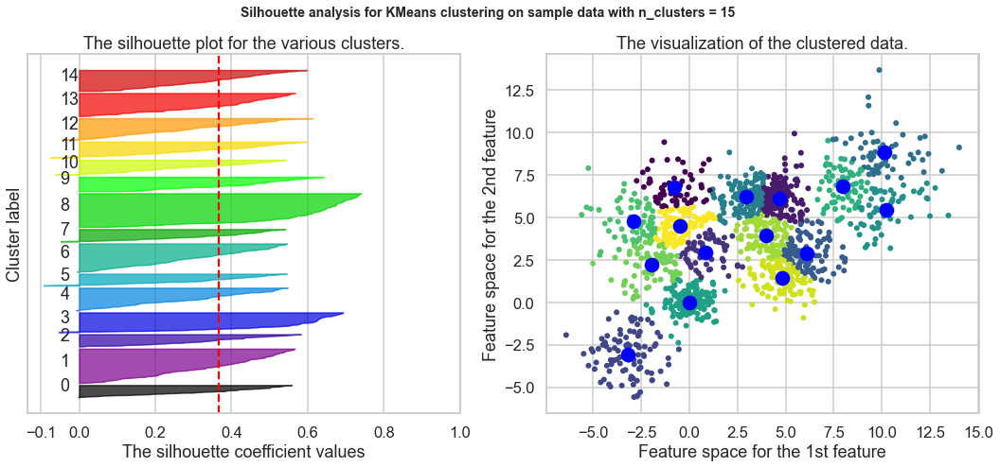

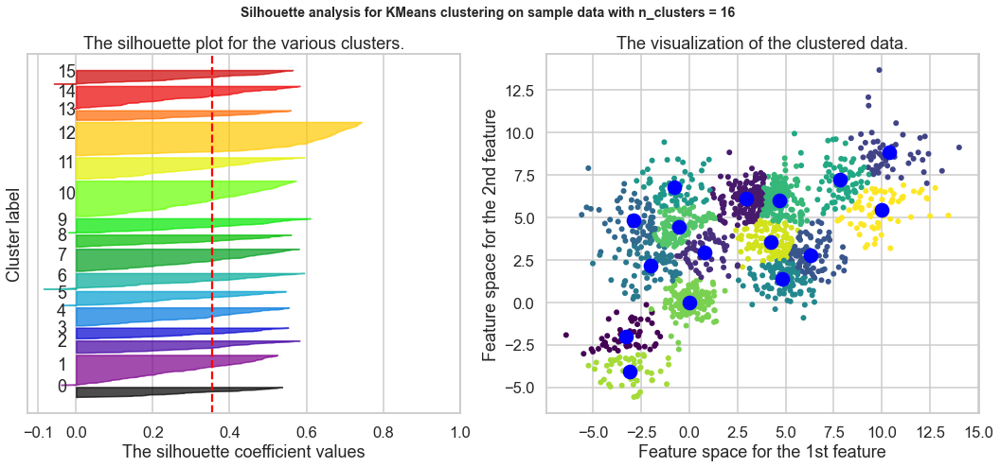

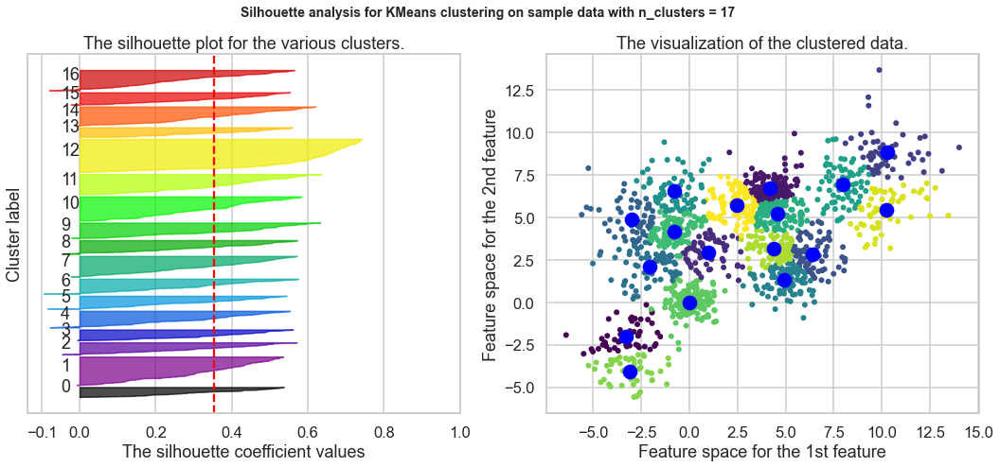

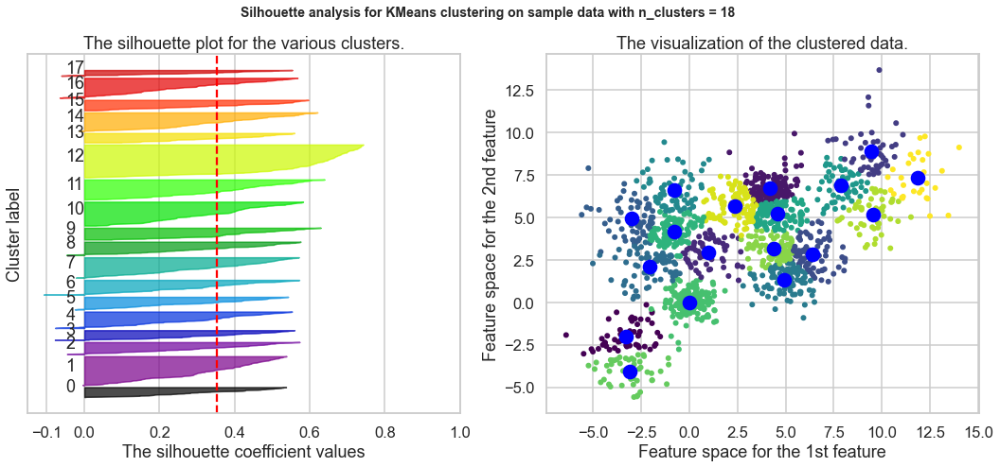

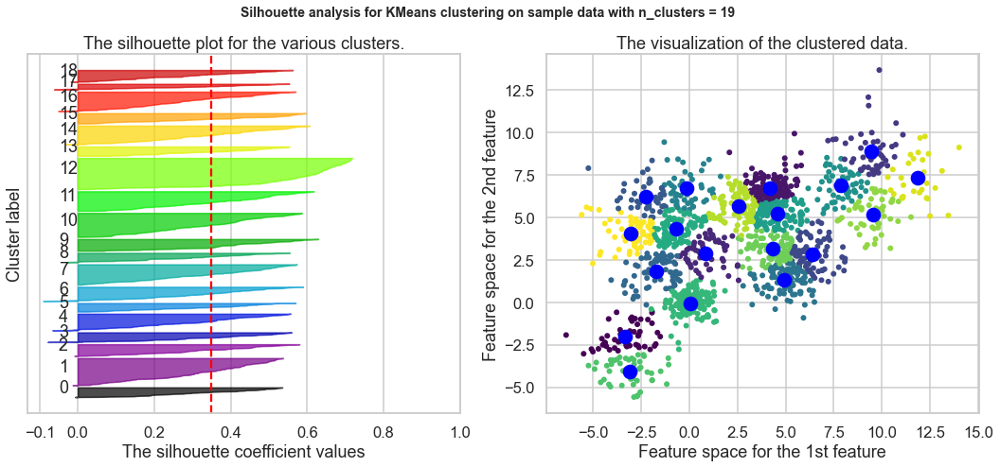

In [213]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = range(2,20)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18,7)
    
    
    kmeans = KMeans(n_clusters,random_state=10)
    p = kmeans.fit_predict(Multi_blob_Data)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(Multi_blob_Data, p)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(Multi_blob_Data, p)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[p == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])# Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    ax2.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=p, s=20, cmap='viridis')
    centers = kmeans.cluster_centers_
    ax2.scatter(centers[:,0], centers[:,1], c='blue', s=200, alpha=1);
  

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

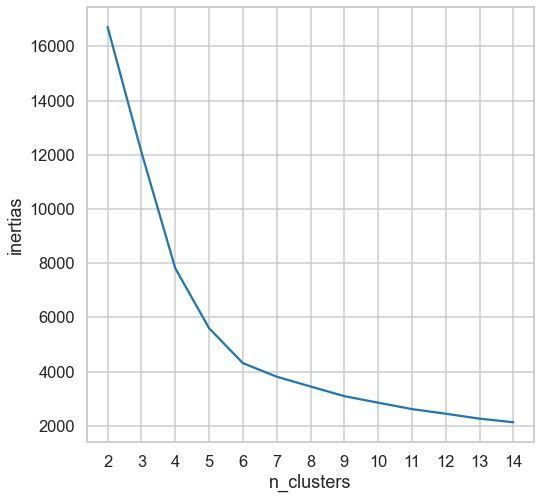

In [7]:
inertias = []
n_clusters = range(2,15)
for i in n_clusters:
    
    kmeans = KMeans(i)
    kmeans.fit(Multi_blob_Data)
    inertias.append(kmeans.inertia_)
    
elbow_plot = pd.DataFrame({'n_clusters': n_clusters, 'inertias': inertias })
sns.lineplot(x='n_clusters', y='inertias', data=elbow_plot);
plt.xticks(n_clusters);

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [8]:
from scipy.cluster.hierarchy import dendrogram, linkage
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


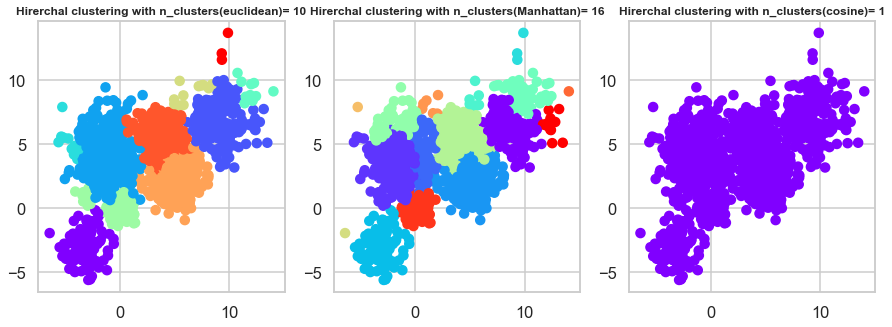

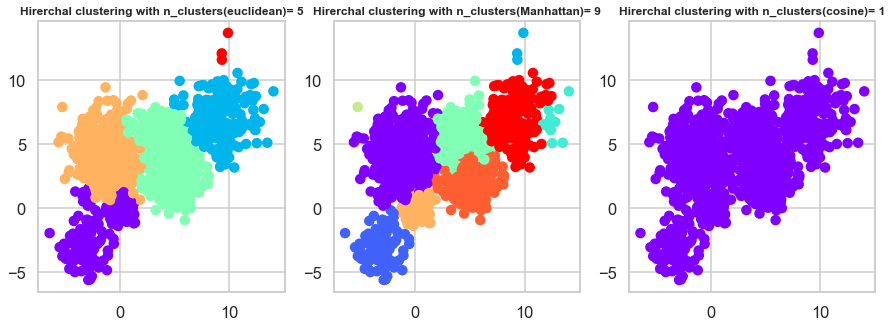

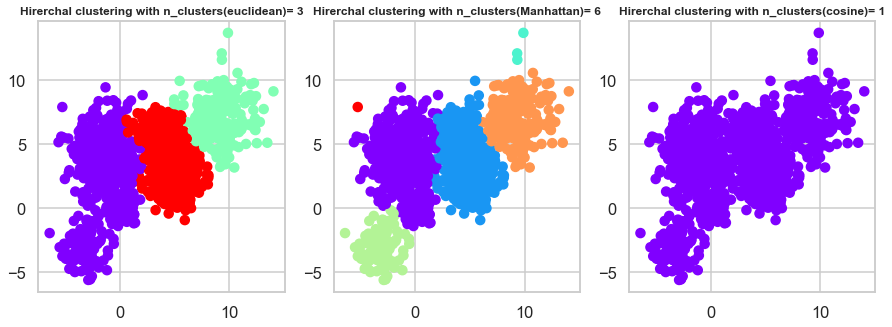

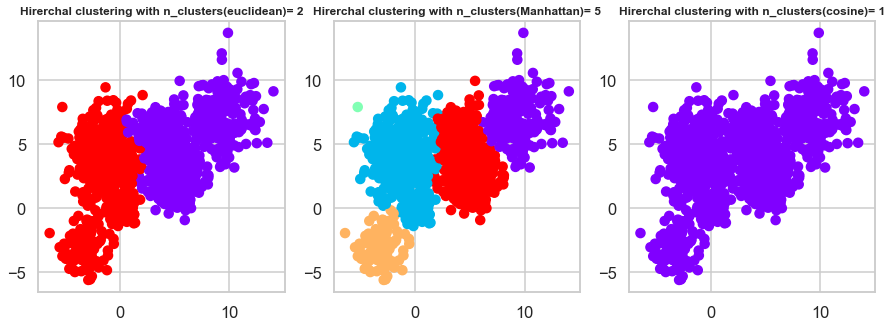

In [10]:
# LINKAGE IS EQUAL TO AVERAGE
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

distance_threshhold = range(4,8)

for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)
    
    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='average',distance_threshold=d)
    trained_model = cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)

    ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
    ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
    
    cluster_m = AgglomerativeClustering(n_clusters=None, affinity='manhattan', linkage='average',distance_threshold=d)
    cluster_m.fit_predict(Multi_blob_Data)
    n_clusters_m = 1+np.amax(cluster_m.labels_)
    
    ax2.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_m.labels_, cmap='rainbow')
    ax2.set_title("Hirerchal clustering with n_clusters(Manhattan)= %d"% n_clusters_m,fontsize=12,fontweight="bold")
    
    cluster_c = AgglomerativeClustering(n_clusters=None, affinity='cosine', linkage='average',distance_threshold=d)
    cluster_c.fit_predict(Multi_blob_Data)
    n_clusters_c = 1+np.amax(cluster_c.labels_)
    
    ax3.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_c.labels_, cmap='rainbow')
    ax3.set_title("Hirerchal clustering with n_clusters(cosine)= %d"% n_clusters_c,fontsize=12,fontweight="bold")
    
    d+=0.2


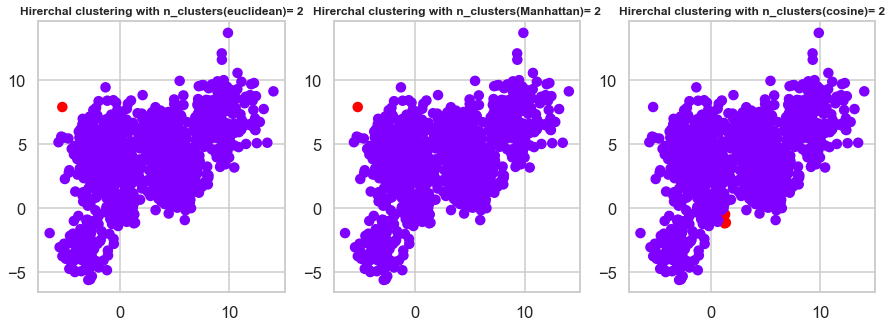

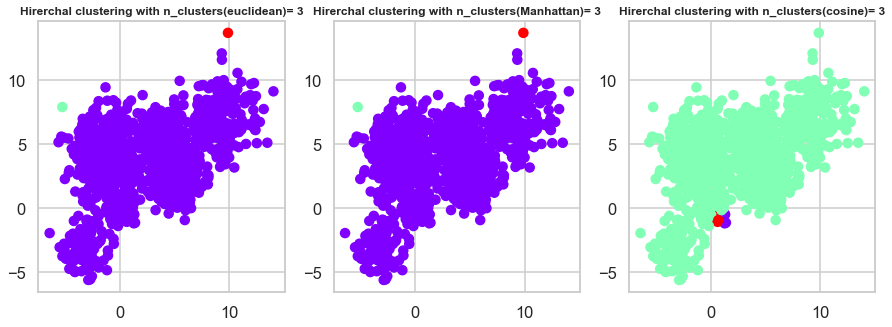

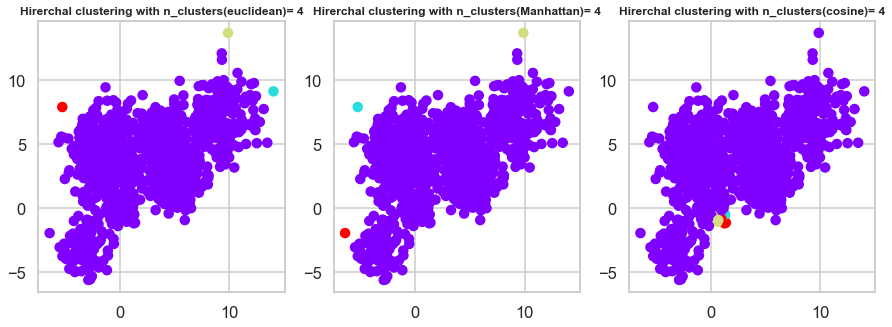

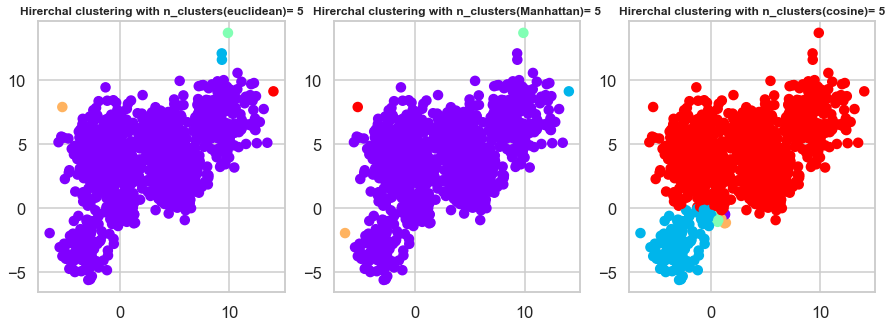

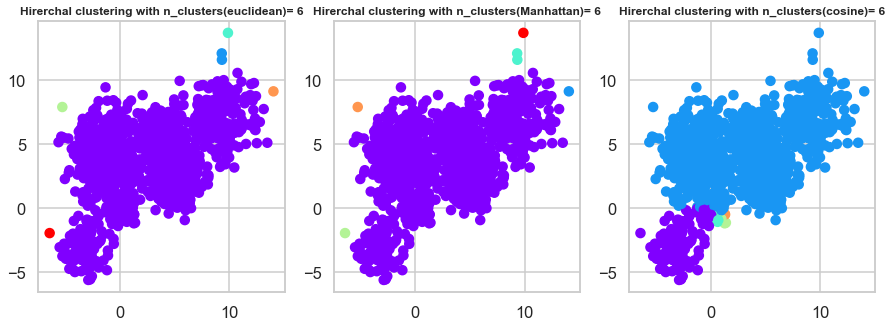

...

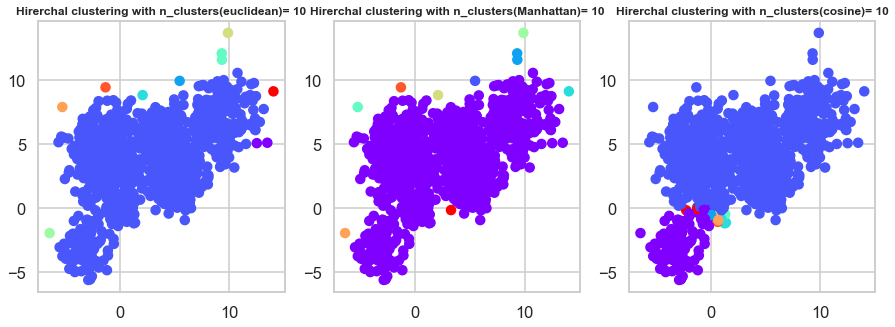

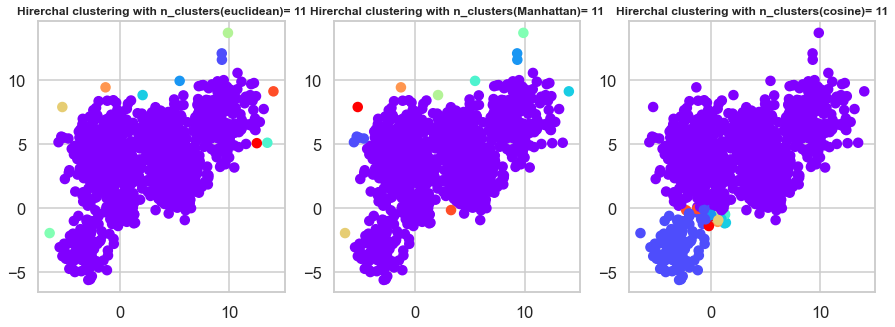

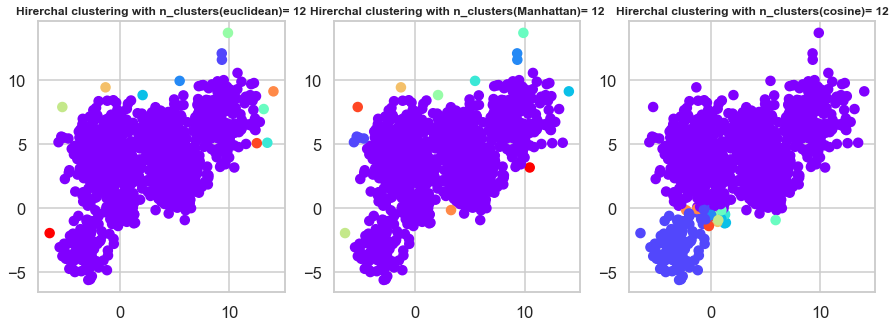

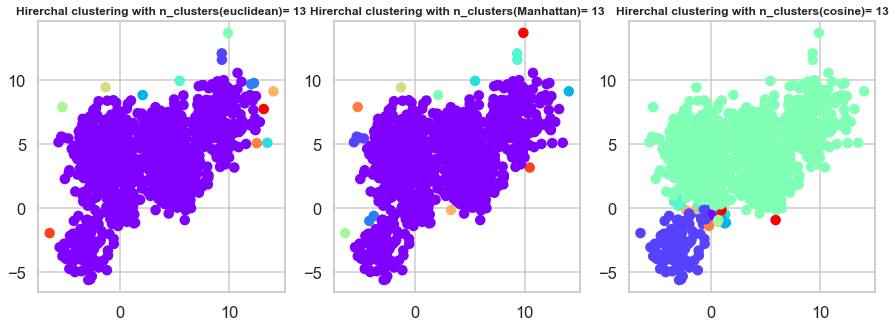

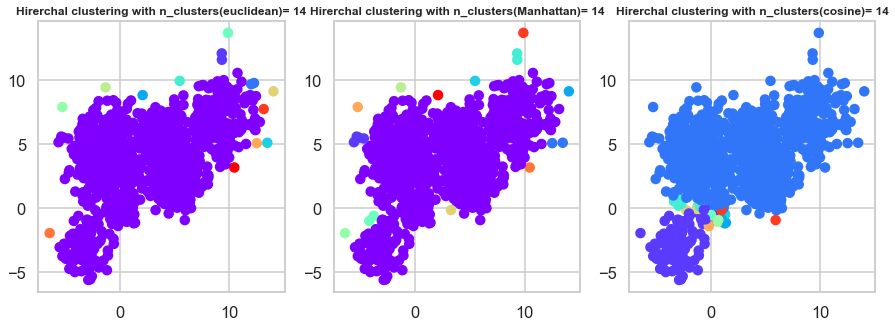

In [11]:
# LINKAGE IS EQUAL TO SINGLE
from sklearn.cluster import AgglomerativeClustering
n_clusters = range(2,15)
for n in n_clusters:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)
    
    cluster_es = AgglomerativeClustering(n_clusters=n, affinity='euclidean', linkage='single')
    cluster_es.fit_predict(Multi_blob_Data)
    
    ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_es.labels_, cmap='rainbow')
    ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n,fontsize=12,fontweight="bold")
    
    cluster_ms = AgglomerativeClustering(n_clusters=n, affinity='manhattan', linkage='single')
    cluster_ms.fit_predict(Multi_blob_Data)
    
    ax2.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_ms.labels_, cmap='rainbow')
    ax2.set_title("Hirerchal clustering with n_clusters(Manhattan)= %d"% n,fontsize=12,fontweight="bold")
    
    cluster_cs = AgglomerativeClustering(n_clusters=n, affinity='cosine', linkage='single')
    cluster_cs.fit_predict(Multi_blob_Data)
    
    ax3.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_cs.labels_, cmap='rainbow')
    ax3.set_title("Hirerchal clustering with n_clusters(cosine)= %d"% n,fontsize=12,fontweight="bold")

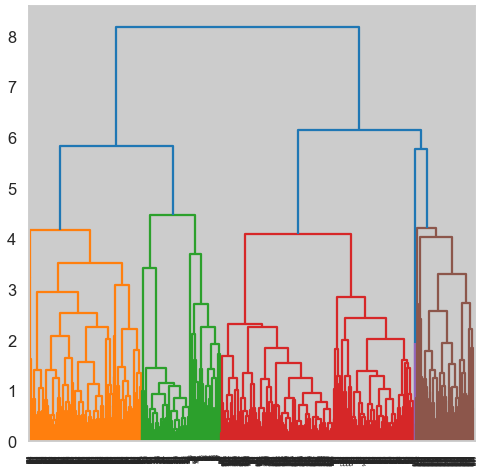

In [12]:
plot_dendrogram(cluster_e)

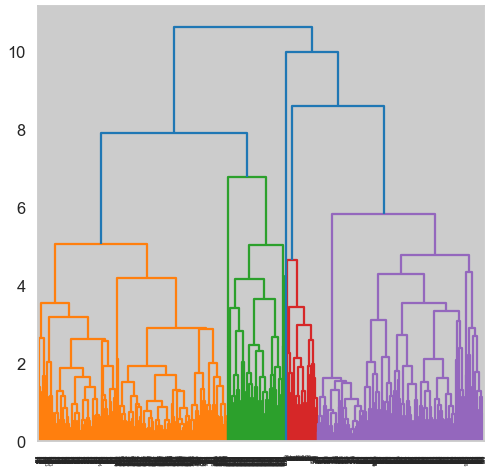

In [13]:
plot_dendrogram(cluster_m)

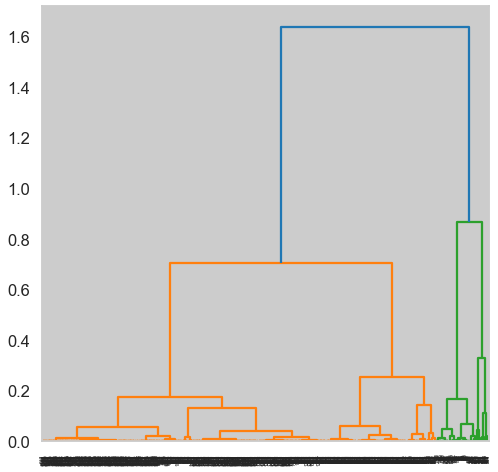

In [14]:
plot_dendrogram(cluster_c)

can't apply Silhouette Score , number of clusters is less than 2


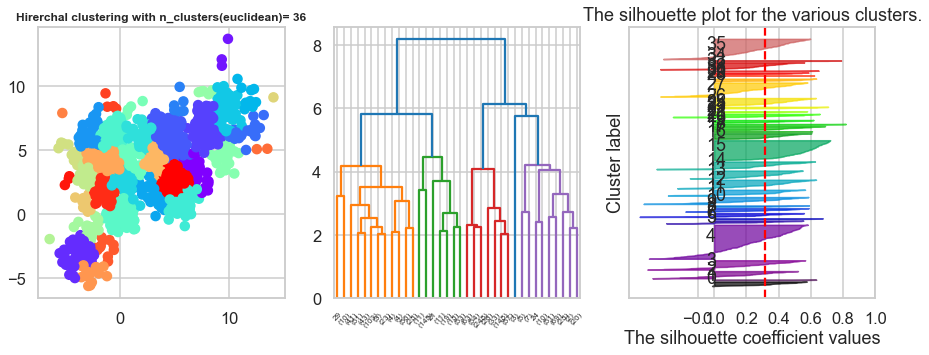

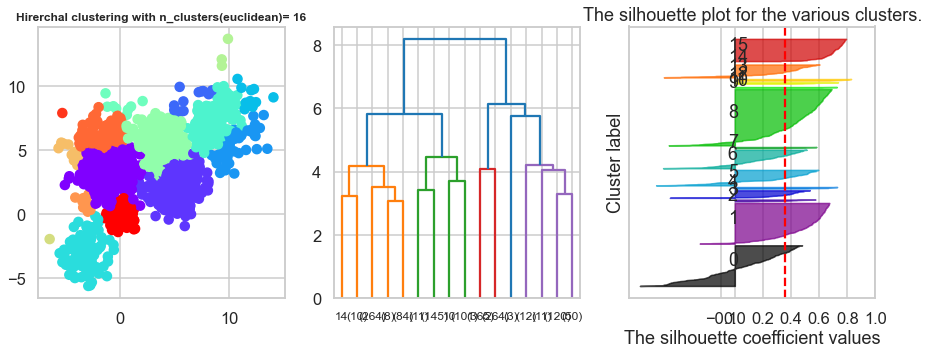

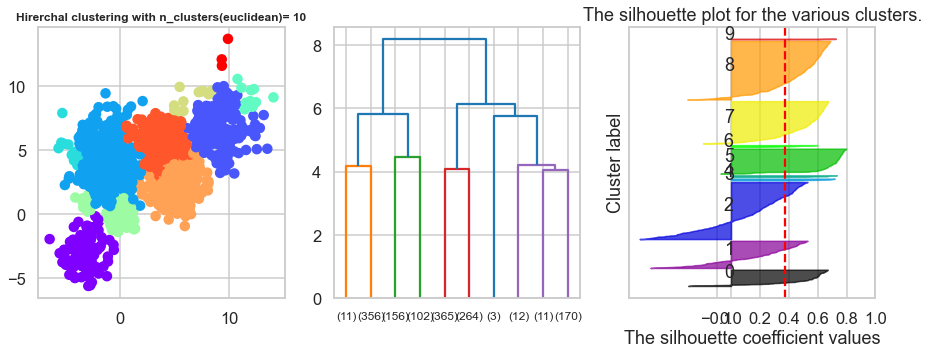

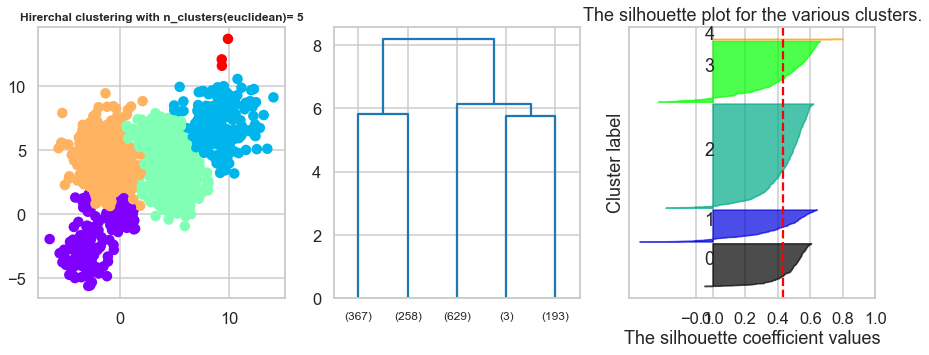

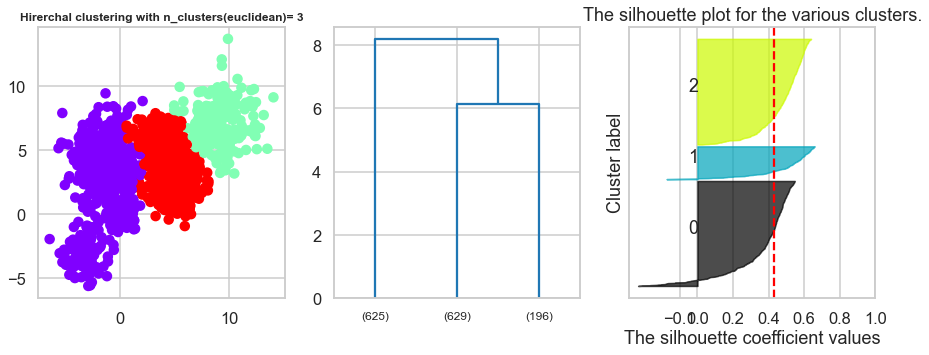

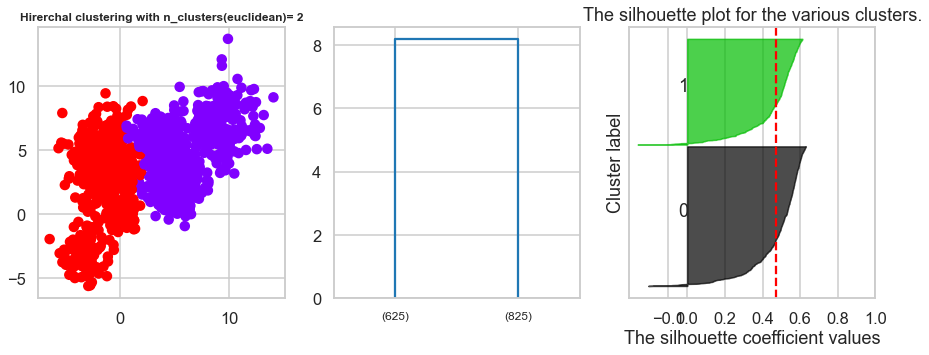

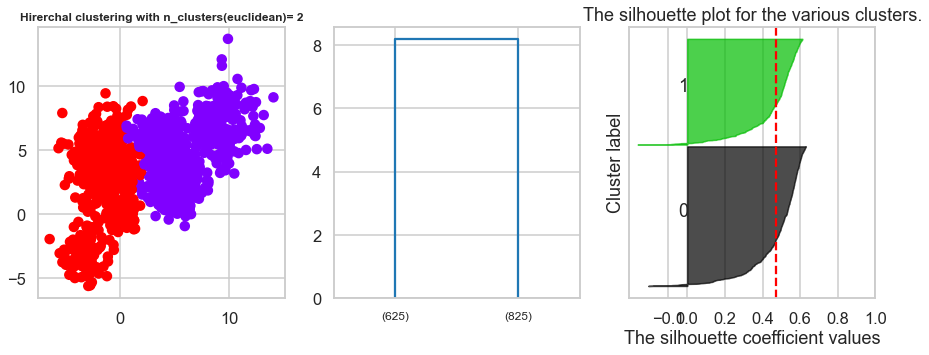

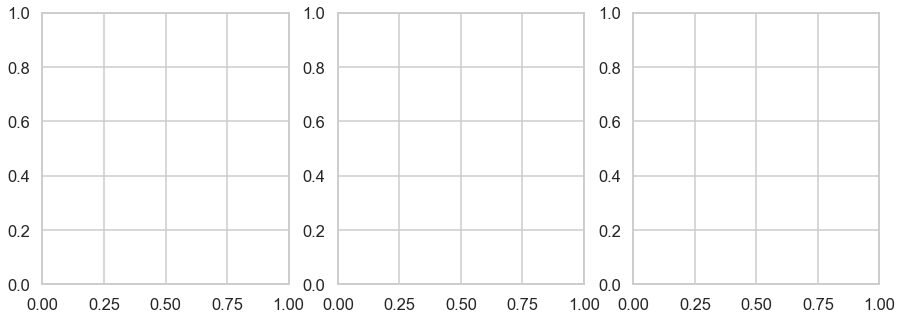

In [17]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(2,10)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='average',distance_threshold=d)
    trained_model= cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(Multi_blob_Data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(Multi_blob_Data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Multi_blob_Data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

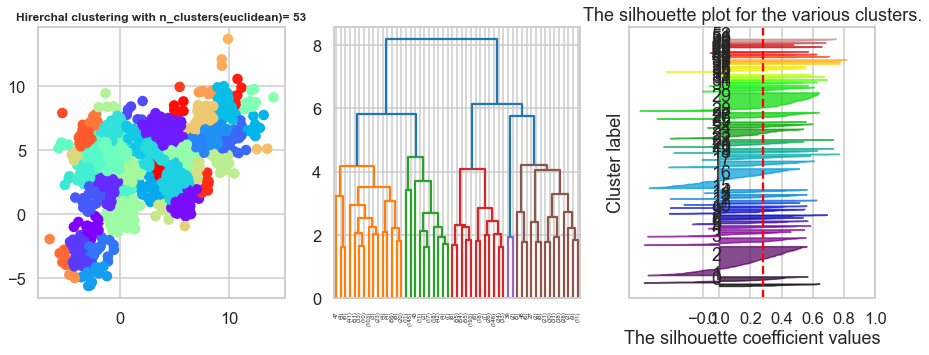

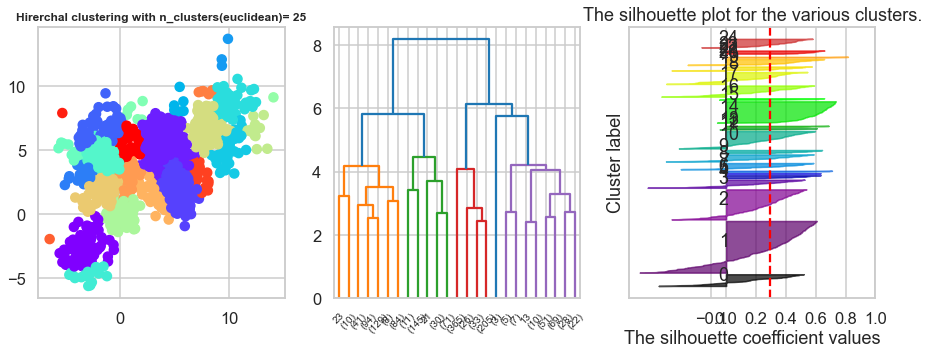

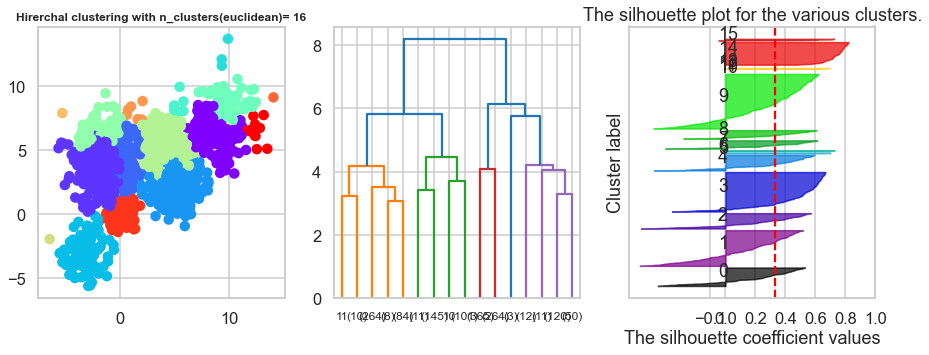

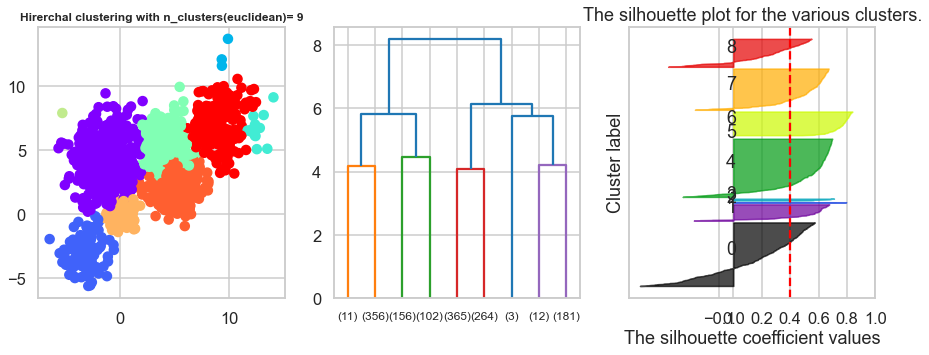

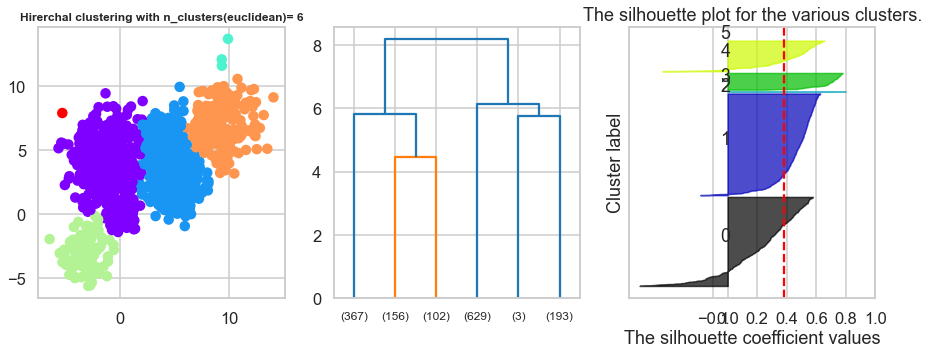

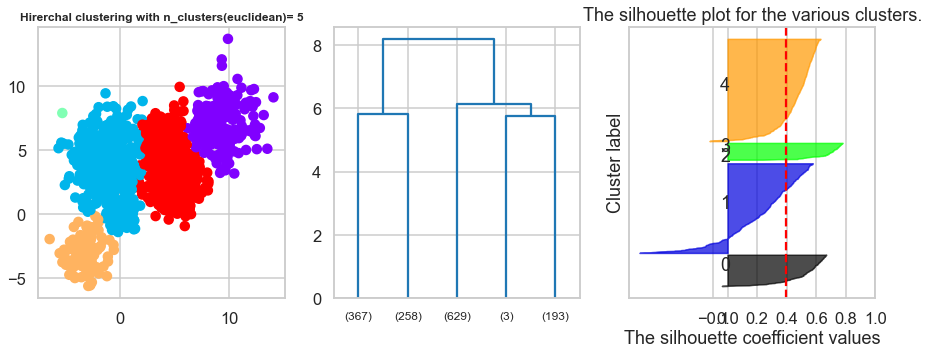

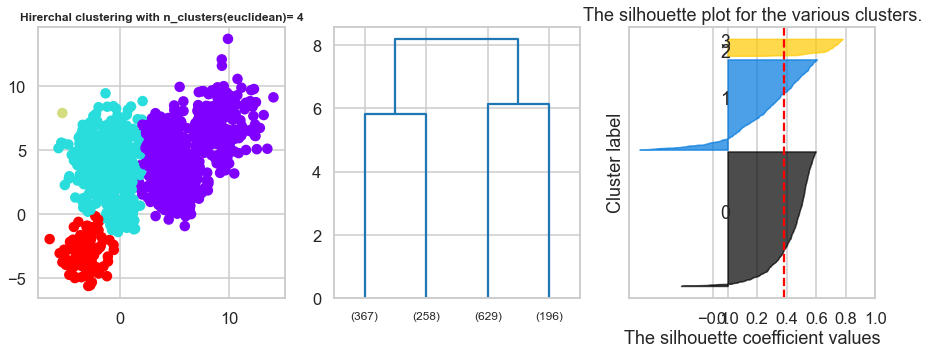

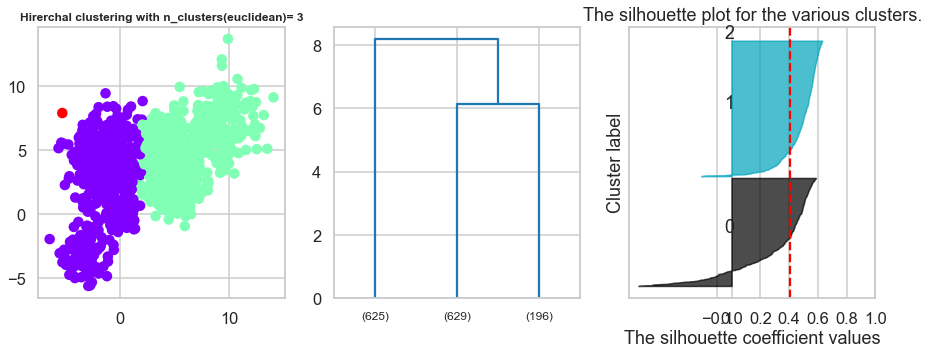

In [170]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(2,10)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='manhattan', linkage='average',distance_threshold=d)
    trained_model= cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(Multi_blob_Data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(Multi_blob_Data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Multi_blob_Data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

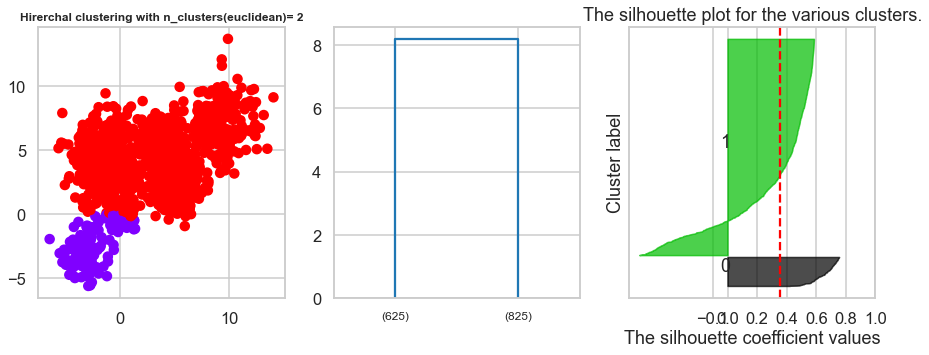

In [182]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(1,2)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='cosine', linkage='average',distance_threshold=d)
    trained_model= cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(Multi_blob_Data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(Multi_blob_Data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Multi_blob_Data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

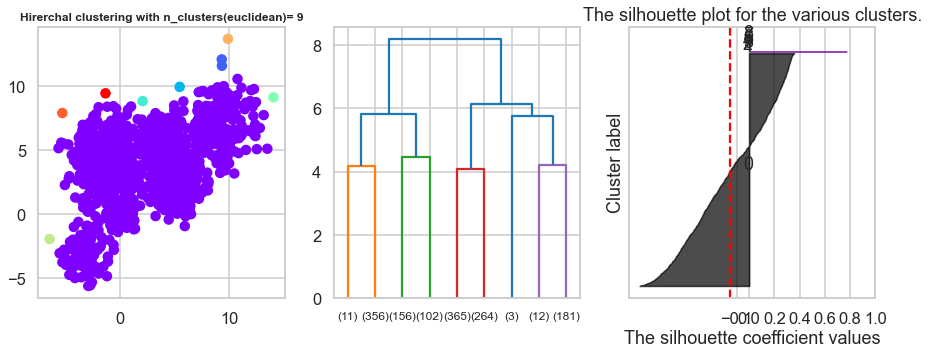

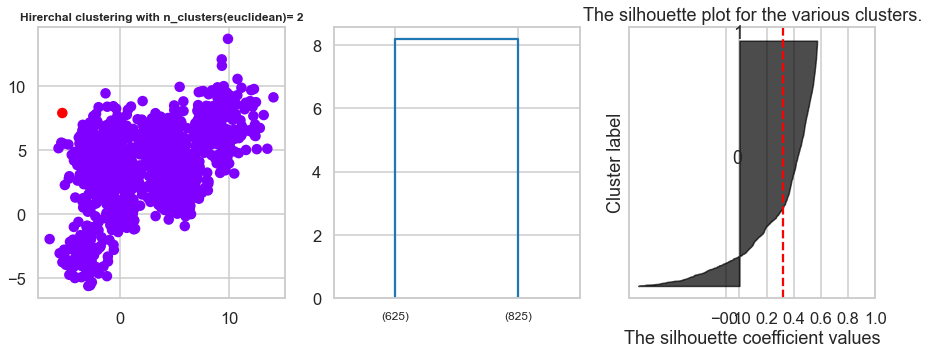

In [188]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(1,3)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='single',distance_threshold=d)
    trained_model= cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(Multi_blob_Data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(Multi_blob_Data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Multi_blob_Data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

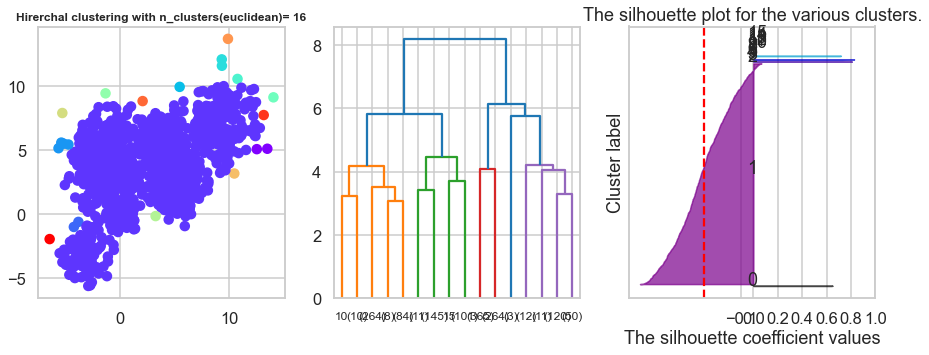

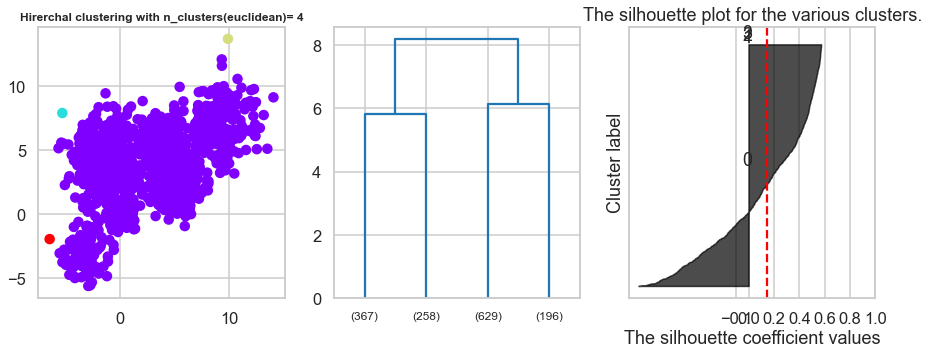

In [187]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(1,3)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='manhattan', linkage='single',distance_threshold=d)
    trained_model= cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(Multi_blob_Data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(Multi_blob_Data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Multi_blob_Data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

can't apply Silhouette Score , number of clusters is less than 2


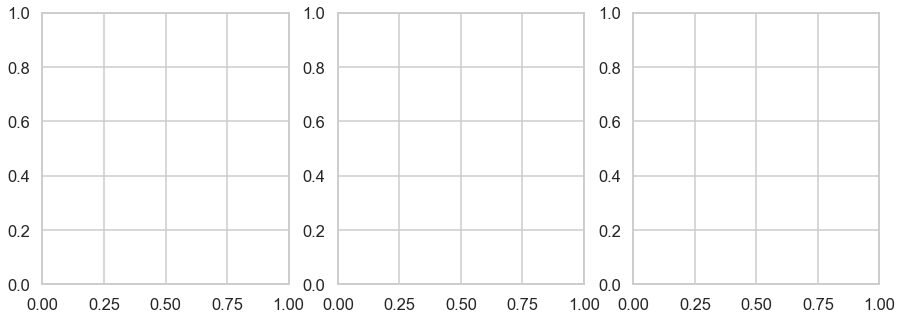

In [193]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(1,2)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='cosine', linkage='single',distance_threshold=d)
    trained_model= cluster_e.fit_predict(Multi_blob_Data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(Multi_blob_Data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(Multi_blob_Data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Multi_blob_Data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

In [ ]:
!pip install plotly

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

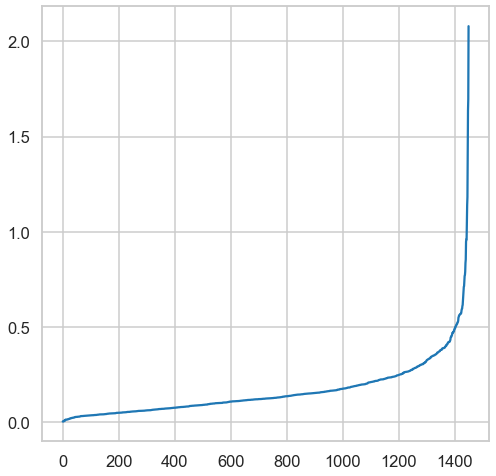

In [232]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

neighbors = NearestNeighbors(n_neighbors = 6)
neighbors_fit = neighbors.fit(Multi_blob_Data)

distances, indices = neighbors_fit.kneighbors(Multi_blob_Data)

distances =np.sort(distances, axis = 0)
distances = distances[:,1]
plt.plot(distances)

In [169]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
Multi_blob_data = scaler.fit_transform(Multi_blob_Data)
max_value = [0,0,0,0]
centers = list(range(2,10))
min_samples = range(5,26)

for eps in [i/10 for i in range(1,31)]:
    for min_samples in range (5,26):
        print(f'\neps {eps}')
        print(f'\nmin samples {min_samples}')
        
        dbscan = DBSCAN(eps = eps, min_samples = min_samples).fit(Multi_blob_Data)
        labels = dbscan.labels_
        no_clusters = len(np.unique(labels) )
        if(no_clusters<2):
            print("Can't apply Silhouette Score , number of clusters is less than 2")
        else:
            score = metrics.silhouette_score(Multi_blob_data,labels)
#             plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=labels,cmap='rainbow')
            print(f'Silhouette Score: {score}')
        if score > max_value[3]:
            max_value=(eps,min_samples, no_clusters, score)
print("epsilon=", max_value[0], 
      "\nmin_sample=", max_value[1],
      "\nnumber of clusters=", max_value[2],
      "\naverage silhouette score= %.4f" % max_value[3])


eps 0.1

min samples 5
Silhouette Score: -0.545374531043964

eps 0.1

min samples 6
Silhouette Score: -0.4941205497764564

eps 0.1

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 10
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 11
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 16
Can't apply Silhouette Score , number of clus

Silhouette Score: 0.12637197669439484

eps 0.6

min samples 20
Silhouette Score: 0.10841952474993516

eps 0.6

min samples 21
Silhouette Score: 0.10439850533542301

eps 0.6

min samples 22
Silhouette Score: 0.0846246220910721

eps 0.6

min samples 23
Silhouette Score: 0.10354654985761681

eps 0.6

min samples 24
Silhouette Score: 0.046841657094818315

eps 0.6

min samples 25
Silhouette Score: 0.03676647496867188

eps 0.7

min samples 5
Silhouette Score: 0.22833215602351262

eps 0.7

min samples 6
Silhouette Score: 0.22133256601712753

eps 0.7

min samples 7
Silhouette Score: 0.24014726896050637

eps 0.7

min samples 8
Silhouette Score: 0.22699768712085003

eps 0.7

min samples 9
Silhouette Score: 0.21652157004201628

eps 0.7

min samples 10
Silhouette Score: 0.20974207654261512

eps 0.7

min samples 11
Silhouette Score: 0.09953101542505859

eps 0.7

min samples 12
Silhouette Score: 0.09604599527904627

eps 0.7

min samples 13
Silhouette Score: 0.1685466454468546

eps 0.7

min samples 1

Silhouette Score: 0.419978174303145

eps 1.3

min samples 7
Silhouette Score: 0.40258400100928304

eps 1.3

min samples 8
Silhouette Score: 0.40258400100928304

eps 1.3

min samples 9
Silhouette Score: 0.3930627771529299

eps 1.3

min samples 10
Silhouette Score: 0.3930627771529299

eps 1.3

min samples 11
Silhouette Score: 0.38318286408950664

eps 1.3

min samples 12
Silhouette Score: 0.3839983571760564

eps 1.3

min samples 13
Silhouette Score: 0.3839983571760564

eps 1.3

min samples 14
Silhouette Score: 0.3863202463225396

eps 1.3

min samples 15
Silhouette Score: 0.3870866039720759

eps 1.3

min samples 16
Silhouette Score: 0.38453731589293827

eps 1.3

min samples 17
Silhouette Score: 0.38164955176122356

eps 1.3

min samples 18
Silhouette Score: 0.38164955176122356

eps 1.3

min samples 19
Silhouette Score: 0.37700672966156334

eps 1.3

min samples 20
Silhouette Score: 0.3759336054752167

eps 1.3

min samples 21
Silhouette Score: 0.3759336054752167

eps 1.3

min samples 22
Silho

Silhouette Score: 0.45059874928072186

eps 1.9

min samples 14
Silhouette Score: 0.45059874928072186

eps 1.9

min samples 15
Silhouette Score: 0.45059874928072186

eps 1.9

min samples 16
Silhouette Score: 0.45059874928072186

eps 1.9

min samples 17
Silhouette Score: 0.45215281991794654

eps 1.9

min samples 18
Silhouette Score: 0.45215281991794654

eps 1.9

min samples 19
Silhouette Score: 0.45215281991794654

eps 1.9

min samples 20
Silhouette Score: 0.45215281991794654

eps 1.9

min samples 21
Silhouette Score: 0.45215281991794654

eps 1.9

min samples 22
Silhouette Score: 0.45215281991794654

eps 1.9

min samples 23
Silhouette Score: 0.4365116914671086

eps 1.9

min samples 24
Silhouette Score: 0.4365116914671086

eps 1.9

min samples 25
Silhouette Score: 0.4365116914671086

eps 2.0

min samples 5
Silhouette Score: 0.4549233014343115

eps 2.0

min samples 6
Silhouette Score: 0.45059874928072186

eps 2.0

min samples 7
Silhouette Score: 0.45059874928072186

eps 2.0

min samples 8


Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 13
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 14
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 15
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 16
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 17
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 18
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 19
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 20
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 21
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 22
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 23
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 24
Silhouette Score: 0.5047268616466032

eps 2.5

min samples 25
Silhouette Score: 0.5047268616466032

eps 2.6

min samples 5
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.6

min samples 6
Can't apply Silh

Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 19
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 20
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 22
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 23
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 24
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 25
Silhouette Score: 0.5047268616466032
epsilon= 2.1 
min_sample= 6 
number of clusters= 2 
average silhouette score= 0.5047


Estimated no. of clusters: 2
Estimated no. of noise points: 1
Silhouette Coefficient: 0.469


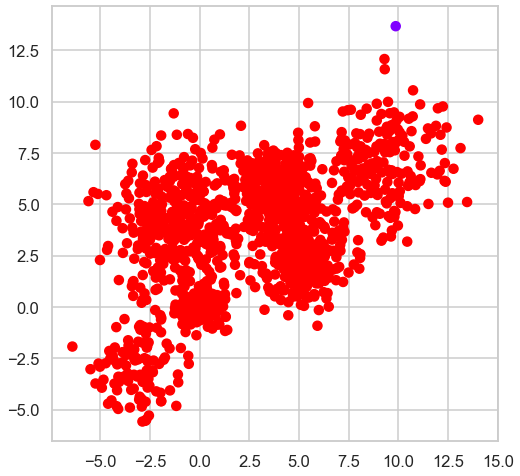

In [167]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
# Compute DBSCAN

db = DBSCAN(eps=2.1, min_samples=6).fit(Multi_blob_Data)
clusters = db.labels_


no_clusters = len(np.unique(clusters) )
no_noise = np.sum(np.array(clusters) == -1, axis=0)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)

# colors = ['rainbow']
# vectorizer = np.vectorize(lambda x: colors[x % len(colors)])

plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=clusters,cmap='rainbow')

#Computing "the Silhouette Score"
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(Multi_blob_Data, clusters))

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

In [71]:
from matplotlib.patches import Ellipse
from sklearn import mixture 

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

In [90]:
from scipy.stats import multivariate_normal
def plot_contours(data, means, covs, title):
    """visualize the gaussian components over the data"""
    plt.figure()
    plt.plot(data[:, 0], data[:, 1], 'ko')

    delta = 0.025
    k = means.shape[0]
    x = np.arange(-2.0, 7.0, delta)
    y = np.arange(-2.0, 7.0, delta)
    x_grid, y_grid = np.meshgrid(x, y)
    coordinates = np.array([x_grid.ravel(), y_grid.ravel()]).T

    col = ['green', 'red', 'indigo']
    for i in range(k):
        mean = means[i]
        cov = covs[i]
        z_grid = multivariate_normal(mean, cov).pdf(coordinates).reshape(x_grid.shape)
        plt.contour(x_grid, y_grid, z_grid, colors = col[i])

    plt.title(title)
    plt.tight_layout()

-7103.083732345952

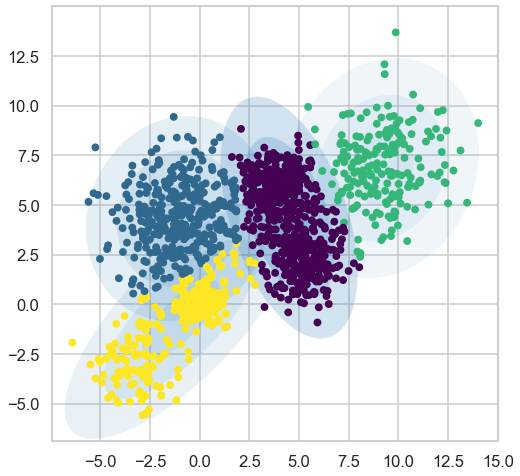

In [117]:
from sklearn import mixture

gmm1 =mixture.GaussianMixture(n_components=4, covariance_type='full', random_state=42)
labels = model.fit_predict(Multi_blob_Data)
plot_gmm(gmm1,Multi_blob_Data)
loglikelihood(Multi_blob_Data, gmm1.weights_, gmm1.means_, gmm1.covariances_)

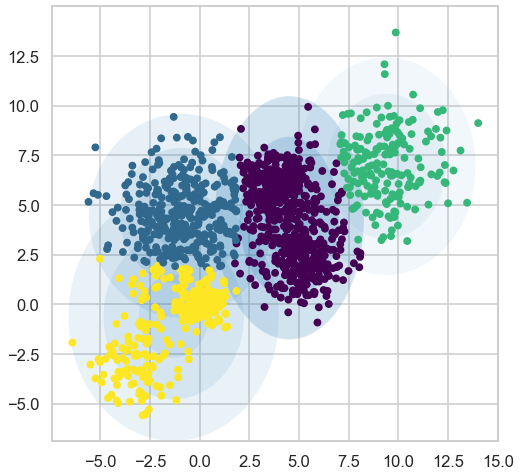

In [136]:
from sklearn import mixture

gmm2 =mixture.GaussianMixture(n_components=4, covariance_type='diag', random_state=42)
labels = model.fit_predict(Multi_blob_Data)
plot_gmm(gmm2,Multi_blob_Data)

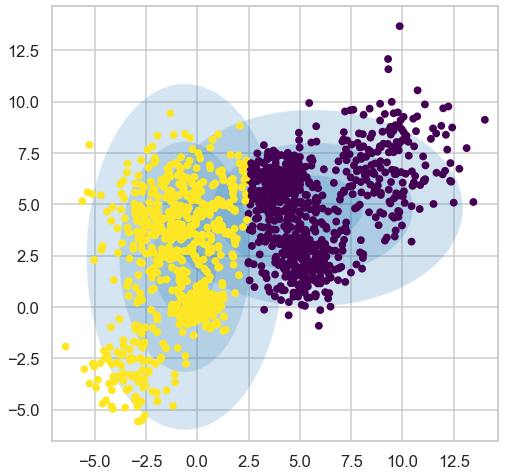

In [135]:
from sklearn import mixture
gmm3=mixture.GaussianMixture(n_components=2, covariance_type='tied', random_state=42)
labels = model.fit_predict(Multi_blob_Data)
plot_gmm(gmm3,Multi_blob_Data)

[[ 73.91067398  70.13666521  64.58265154 ... 142.51380419 147.60082034
  152.83905065]
 [ 69.78177551  67.39544478  62.92134592 ... 134.52938337 139.53601192
  144.69385463]
 [ 65.89458839  63.6889886   60.91176263 ... 126.85878847 131.78502943
  136.86248453]
 ...
 [171.06184082 161.93431553 153.21468158 ... 106.49184653 107.80064541
  109.26065843]
 [176.7160752  167.5248033  158.74142275 ... 113.257244   114.48565528
  115.8652807 ]
 [182.52201952 173.26700101 164.41987385 ... 120.3364674  121.48449108
  122.7837289 ]]


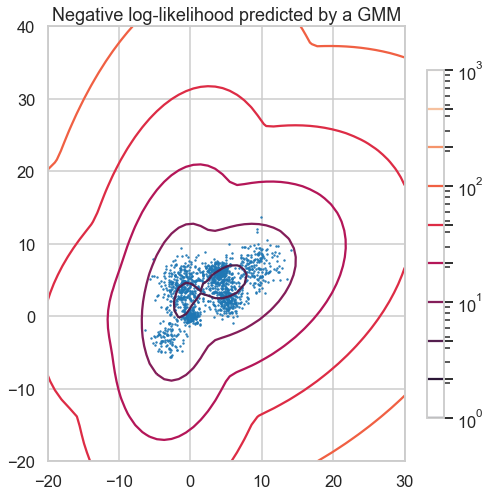

In [141]:
clf = mixture.GaussianMixture(n_components=2, covariance_type="full")
clf.fit(Multi_blob_Data)

# display predicted scores by the model as a contour plot
x = np.linspace(-20.0, 30.0)
y = np.linspace(-20.0, 40.0)
X, Y = np.meshgrid(x, y)
XX = np.array([X.ravel(), Y.ravel()]).T
Z = -clf.score_samples(XX)
Z = Z.reshape(X.shape)
print(Z)
CS = plt.contour(
    X, Y, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10)
)
CB = plt.colorbar(CS, shrink=0.8, extend="both")
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], 0.8)

plt.title("Negative log-likelihood predicted by a GMM")
plt.axis("tight")
plt.show()

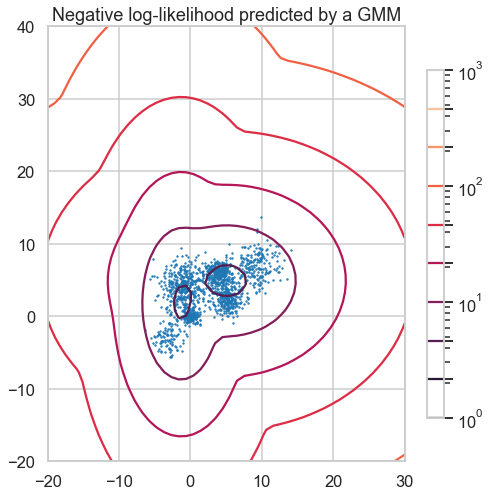

In [133]:
clf = mixture.GaussianMixture(n_components=2, covariance_type="diag")
clf.fit(Multi_blob_Data)

# display predicted scores by the model as a contour plot
x = np.linspace(-20.0, 30.0)
y = np.linspace(-20.0, 40.0)
X, Y = np.meshgrid(x, y)
XX = np.array([X.ravel(), Y.ravel()]).T
Z = -clf.score_samples(XX)
Z = Z.reshape(X.shape)

CS = plt.contour(
    X, Y, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10)
)
CB = plt.colorbar(CS, shrink=0.8, extend="both")
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], 0.8)

plt.title("Negative log-likelihood predicted by a GMM")
plt.axis("tight")
plt.show()

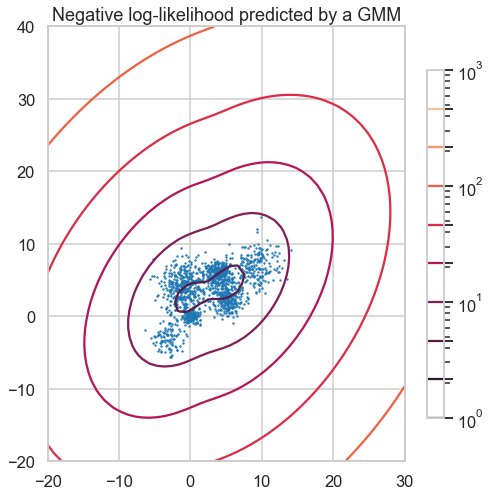

In [134]:
clf = mixture.GaussianMixture(n_components=2, covariance_type="tied")
clf.fit(Multi_blob_Data)

# display predicted scores by the model as a contour plot
x = np.linspace(-20.0, 30.0)
y = np.linspace(-20.0, 40.0)
X, Y = np.meshgrid(x, y)
XX = np.array([X.ravel(), Y.ravel()]).T
Z = -clf.score_samples(XX)
Z = Z.reshape(X.shape)

CS = plt.contour(
    X, Y, Z, norm=LogNorm(vmin=1.0, vmax=1000.0), levels=np.logspace(0, 3, 10)
)
CB = plt.colorbar(CS, shrink=0.8, extend="both")
plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], 0.8)

plt.title("Negative log-likelihood predicted by a GMM")
plt.axis("tight")
plt.show()

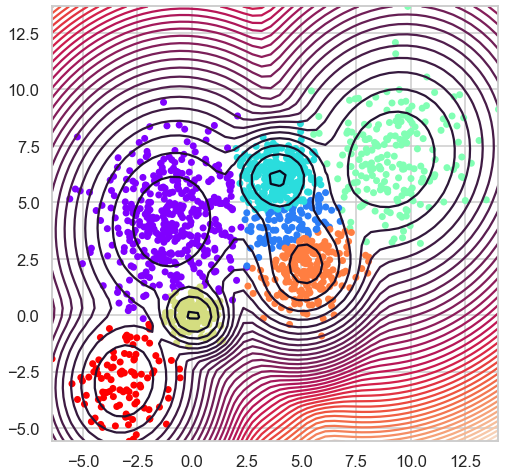

silhouette Score=0.48567327695888446


In [151]:
from sklearn import mixture
gmm=mixture.GaussianMixture(n_components=7, covariance_type='full')
gmm.fit(Multi_blob_Data)
cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster, s=30, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

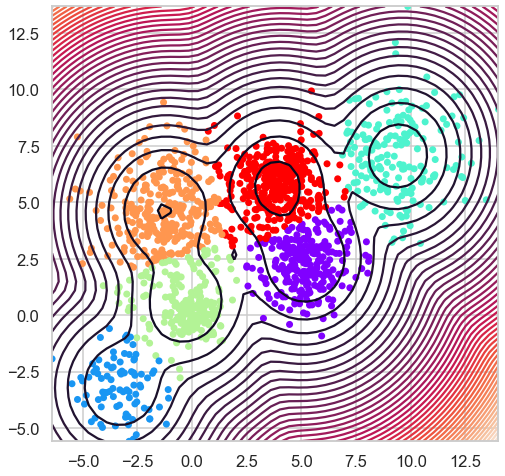

silhouette Score=0.48567327695888446


In [143]:
from sklearn import mixture
gmm=mixture.GaussianMixture(n_components=6, covariance_type='tied')
gmm.fit(Multi_blob_Data)
cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster, s=30, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

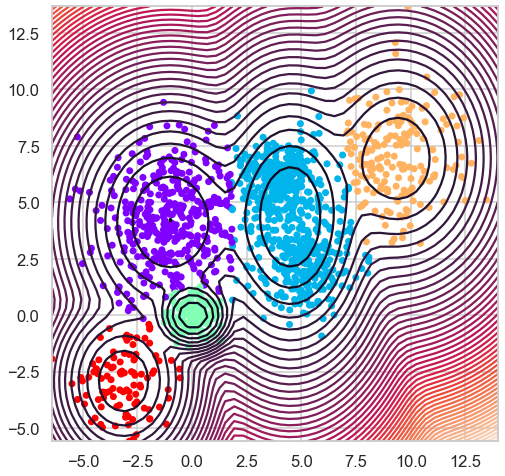

silhouette Score=0.48567327695888446


In [150]:
from sklearn import mixture
gmm=mixture.GaussianMixture(n_components=5, covariance_type='diag')
gmm.fit(Multi_blob_Data)
cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster, s=30, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

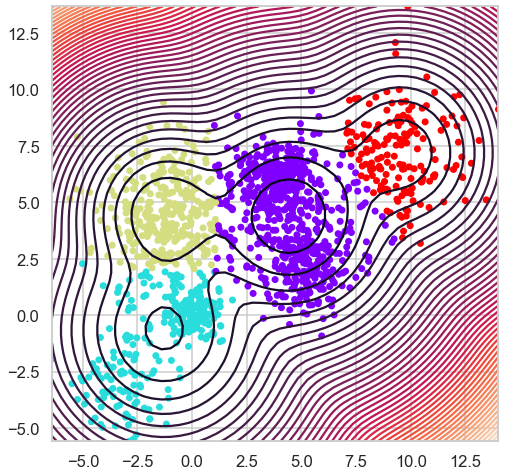

silhouette Score=0.48567327695888446


In [149]:
from sklearn import mixture
gmm=mixture.GaussianMixture(n_components=4, covariance_type='spherical')
gmm.fit(Multi_blob_Data)
cluster=gmm.fit_predict(Multi_blob_Data)
x_min=(min(Multi_blob_Data[:, 0]))
x_max=(max(Multi_blob_Data[:, 0]))
y_min=(min(Multi_blob_Data[:, 1]))
y_max=(max(Multi_blob_Data[:, 1]))
X,Y=np.meshgrid(np.linspace(x_min,x_max),np.linspace(y_min,y_max))
XX=np.array([X.ravel(),Y.ravel()]).T
Z=-gmm.score_samples(XX)
Z=Z.reshape((50,50))
plt.contour(X,Y,Z,levels=50)
plt.scatter(Multi_blob_Data[:,0],Multi_blob_Data[:,1], c=cluster, s=30, cmap='rainbow')
plt.show()
print("silhouette Score={}".format(silhouette_score(Multi_blob_Data,Cluster)))

In [80]:
Sum_bic = []
Sum_aic = []

K = range(1,8)
for k in K:
    gmm = mixture.GaussianMixture(n_components=k)
    gmm = gmm.fit(Multi_blob_Data)
    Sum_bic.append(gmm.bic(Multi_blob_Data))
    Sum_aic.append(gmm.aic(Multi_blob_Data))

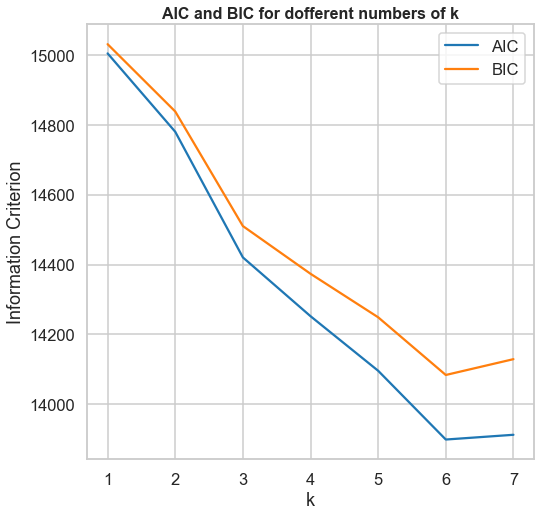

In [81]:
x1 = K
y1 = Sum_aic
plt.plot(x1, y1, label = "AIC")
x2 = K
y2 = Sum_bic
plt.plot(x2, y2, label = "BIC")

plt.title("AIC and BIC for dofferent numbers of k", fontsize=16, fontweight='bold')
plt.xlabel("k")
plt.ylabel("Information Criterion")
plt.legend(loc='upper right')
plt.show()

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [208]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

For n_clusters = 2 The average silhouette_score is : 0.681046169211746
For n_clusters = 3 The average silhouette_score is : 0.5528190123564091
For n_clusters = 4 The average silhouette_score is : 0.4980505049972867
For n_clusters = 5 The average silhouette_score is : 0.4887488870931048
For n_clusters = 6 The average silhouette_score is : 0.3648340039670018
For n_clusters = 7 The average silhouette_score is : 0.354457992531674
For n_clusters = 8 The average silhouette_score is : 0.34873453772193763
For n_clusters = 9 The average silhouette_score is : 0.31944608860386825
For n_clusters = 10 The average silhouette_score is : 0.32363460215614437
For n_clusters = 11 The average silhouette_score is : 0.320468613661749
For n_clusters = 12 The average silhouette_score is : 0.31773961876681994
For n_clusters = 13 The average silhouette_score is : 0.29549311758977864
For n_clusters = 14 The average silhouette_score is : 0.30195508668959803
For n_clusters = 15 The average silhouette_score is : 0.

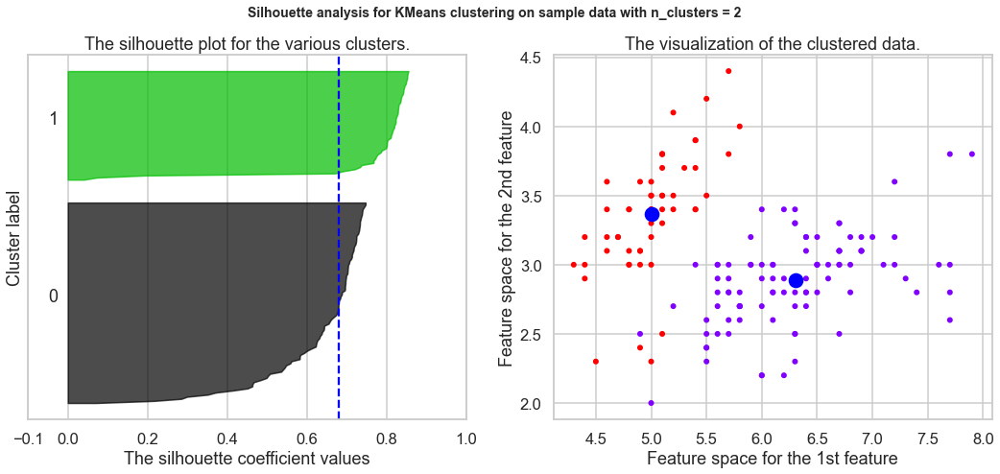

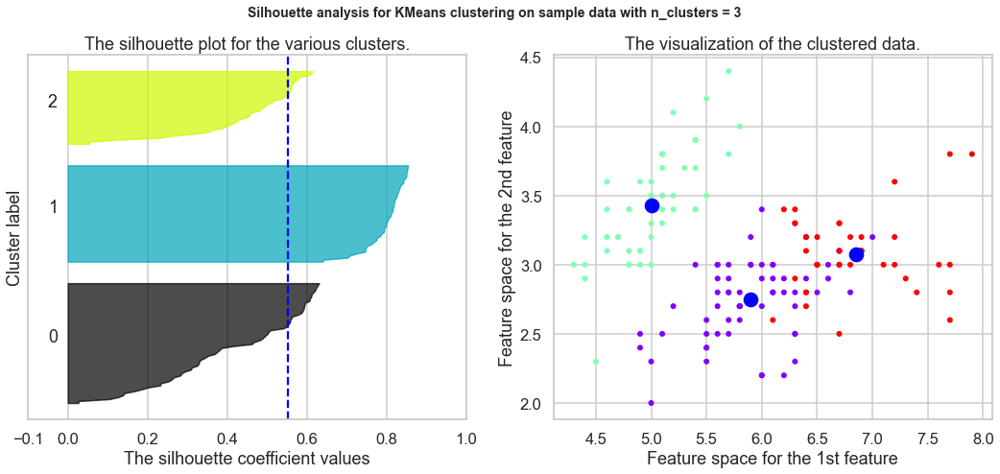

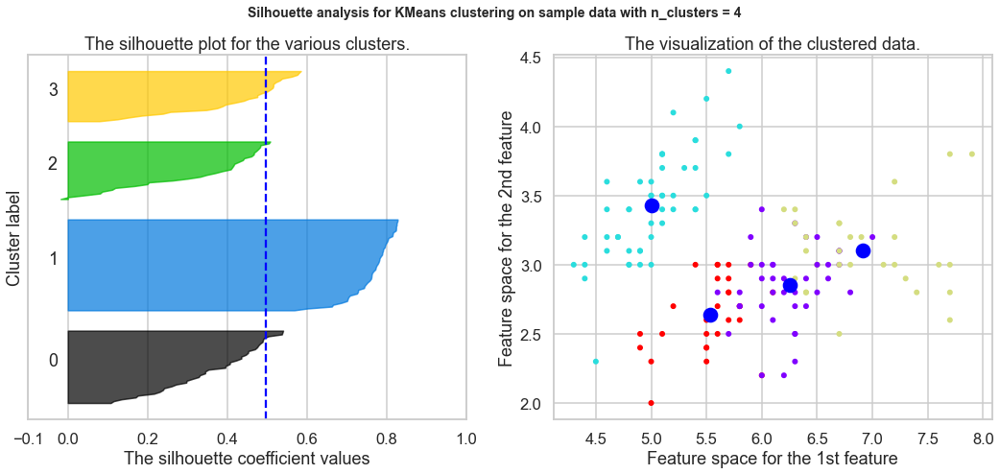

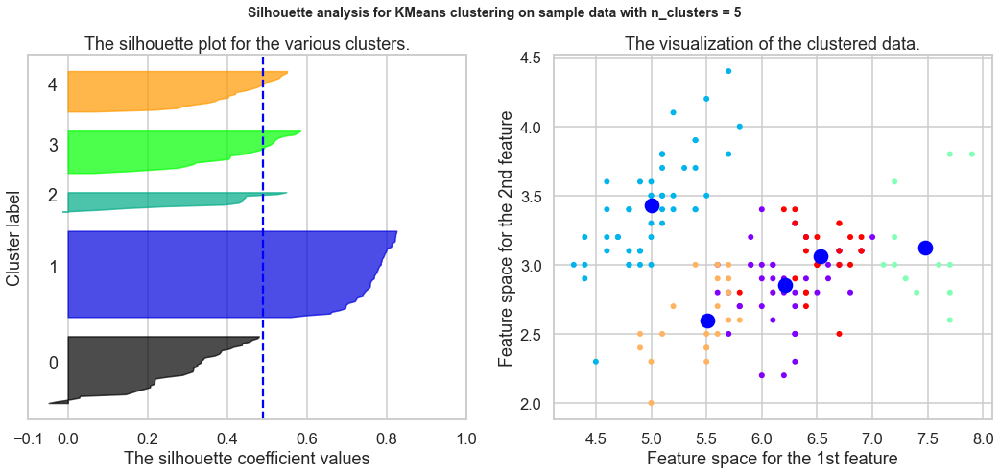

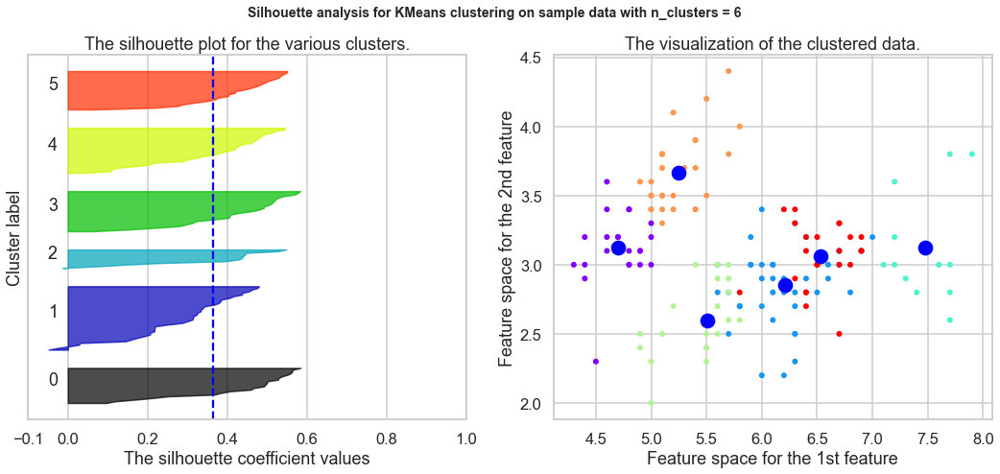

...

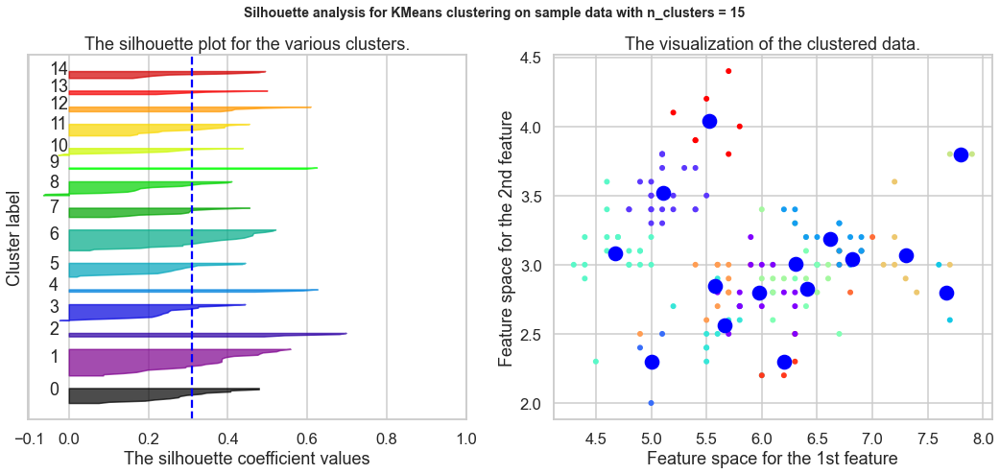

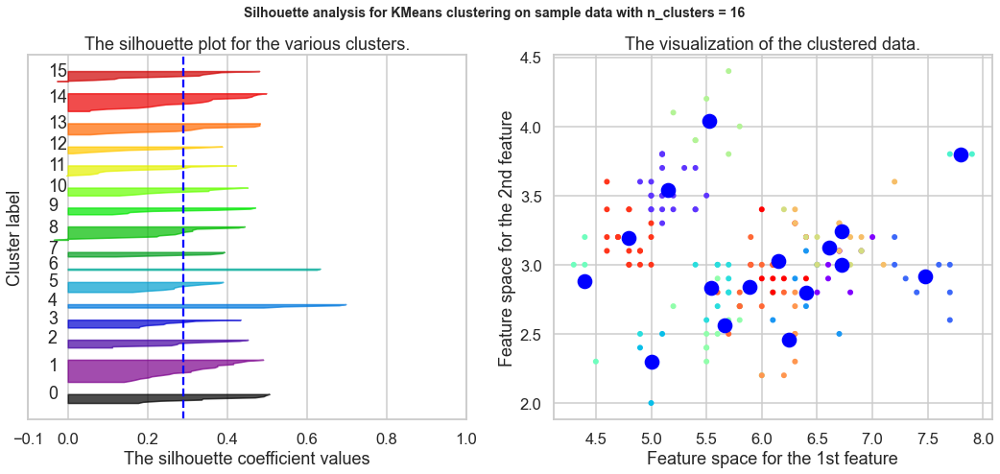

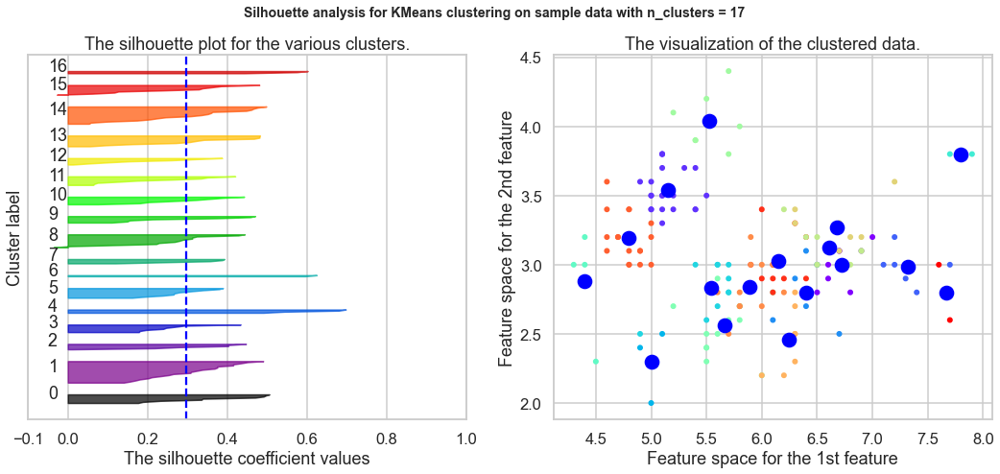

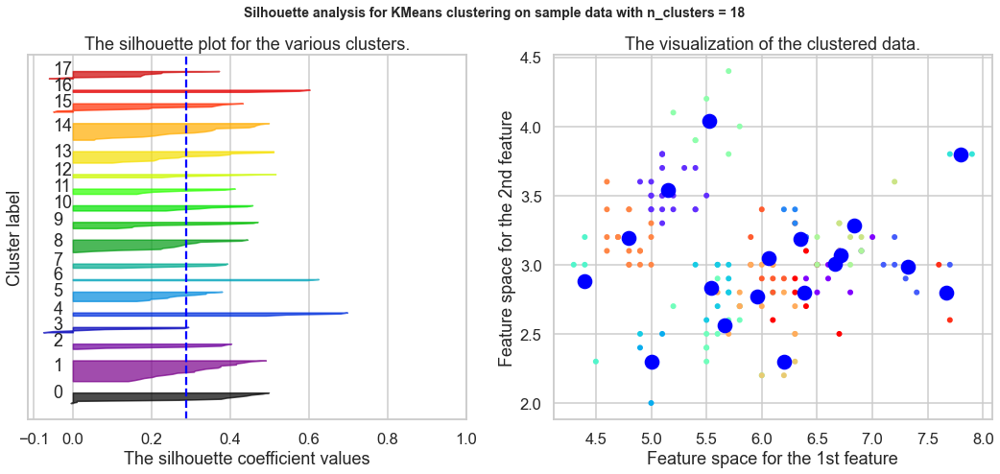

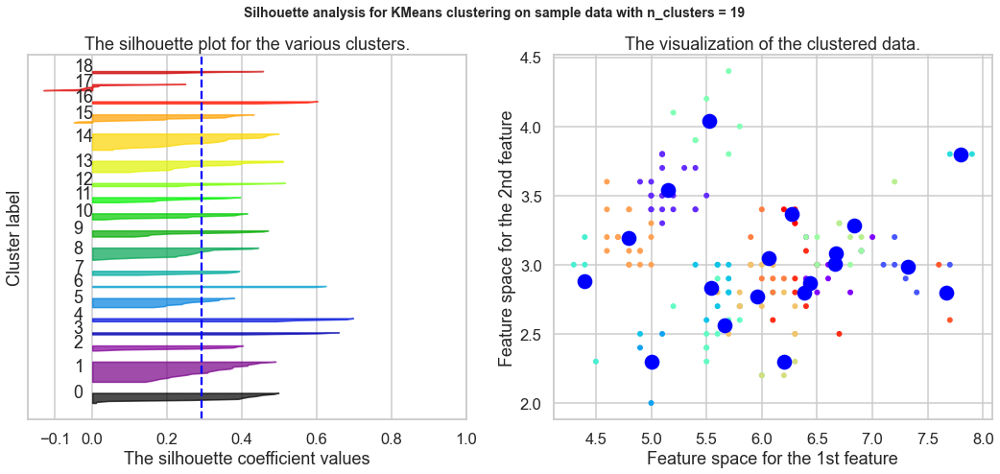

In [214]:
range_clusters = range(2,20)

for n_clusters in range_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18,7)
    
    
    kmeans = KMeans(n_clusters,random_state=10)
    p = kmeans.fit_predict(iris_data.data)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(iris_data.data, p)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(iris_data.data, p)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[p == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="blue", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    ax2.scatter(iris_data.data[:,0], iris_data.data[:,1], c=p, s=20, cmap='rainbow')
    centers = kmeans.cluster_centers_
    ax2.scatter(centers[:,0], centers[:,1], c='blue', s=200, alpha=1);
  

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

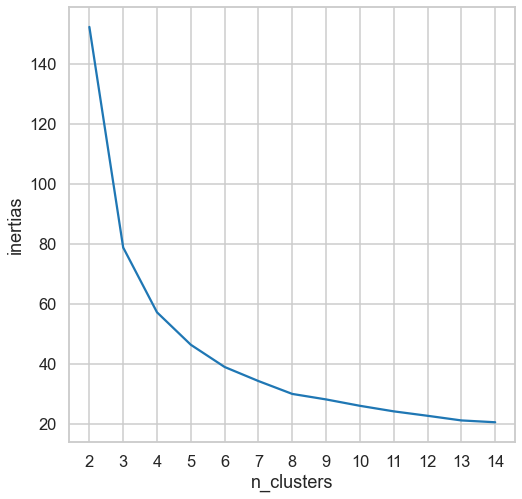

In [249]:
inertias = []
n_clusters = range(2,15)
for i in n_clusters:
    
    kmeans = KMeans(i)
    kmeans.fit(iris_data.data)
    inertias.append(kmeans.inertia_)
    
elbow_plot = pd.DataFrame({'n_clusters': n_clusters, 'inertias': inertias })
sns.lineplot(x='n_clusters', y='inertias', data=elbow_plot);
plt.xticks(n_clusters);

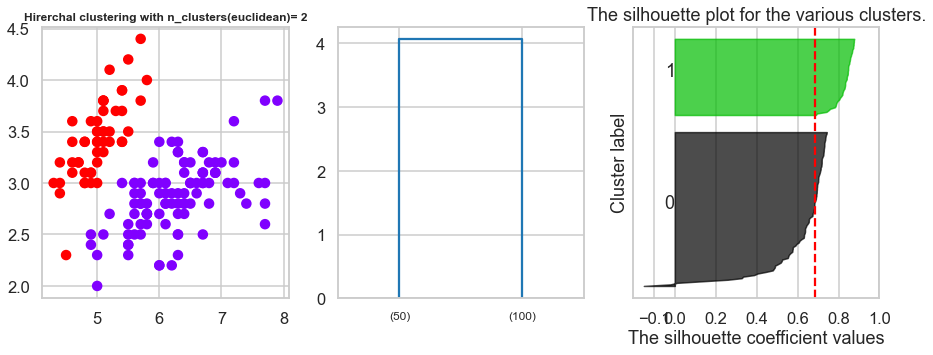

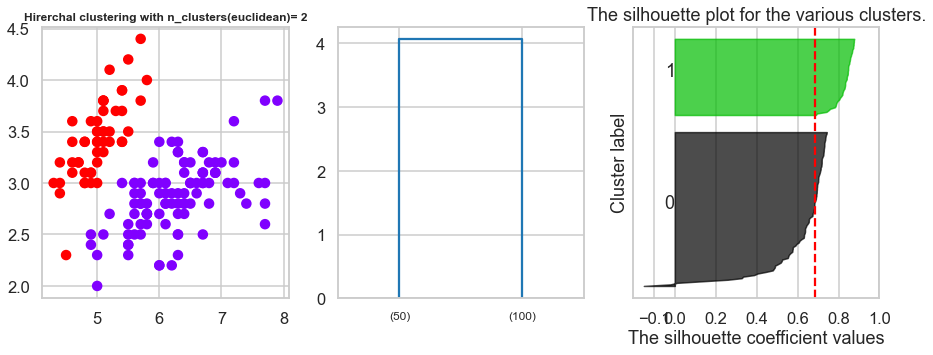

In [218]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(2,4)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='average',distance_threshold=d)
    trained_model= cluster_e.fit_predict(iris_data.data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(iris_data.data[:,0],iris_data.data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(iris_data.data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(iris_data.data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(iris_data.data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

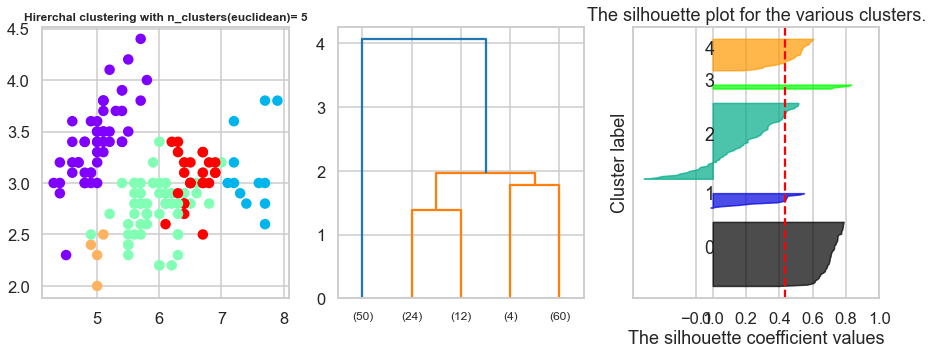

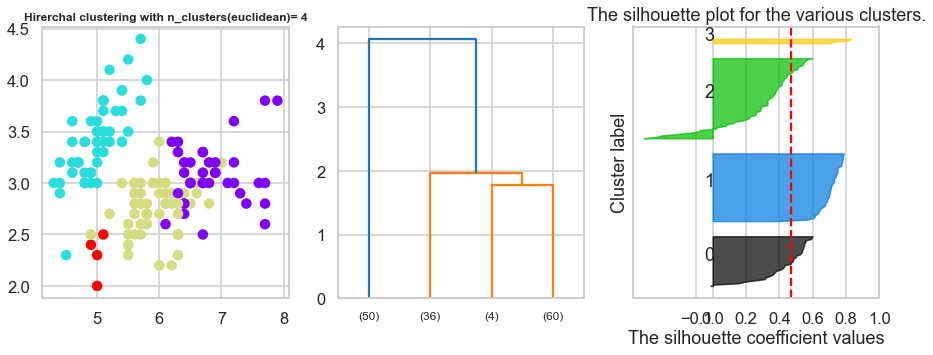

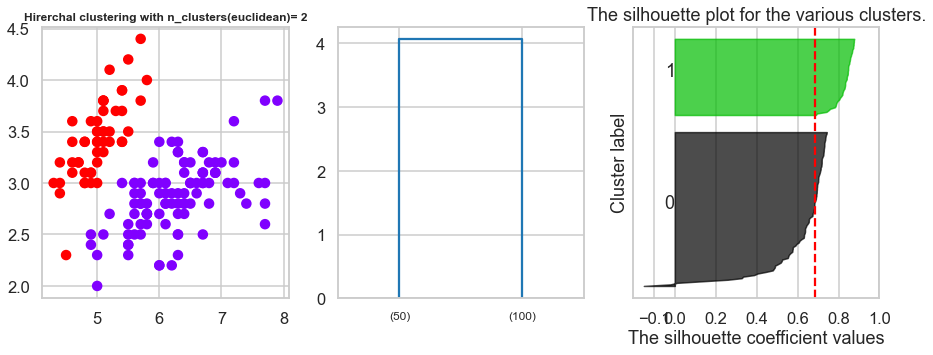

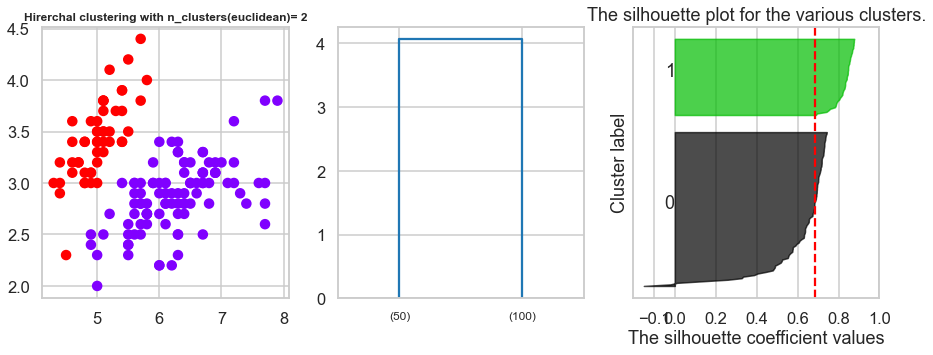

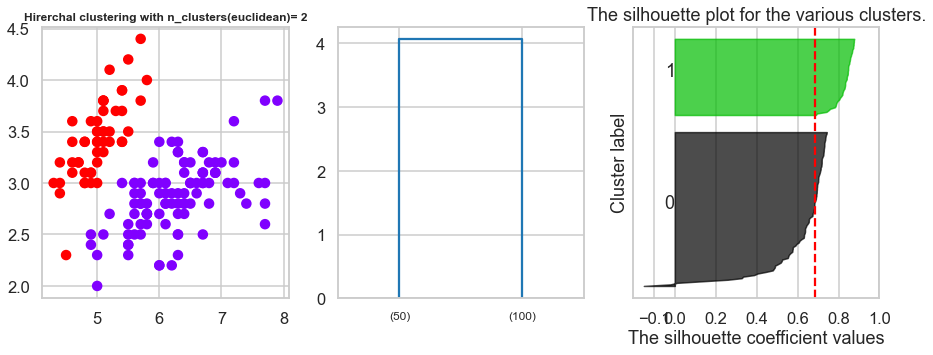

In [222]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(2,7)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='manhattan', linkage='average',distance_threshold=d)
    trained_model= cluster_e.fit_predict(iris_data.data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(iris_data.data[:,0],iris_data.data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(iris_data.data, method='average', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(iris_data.data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(iris_data.data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

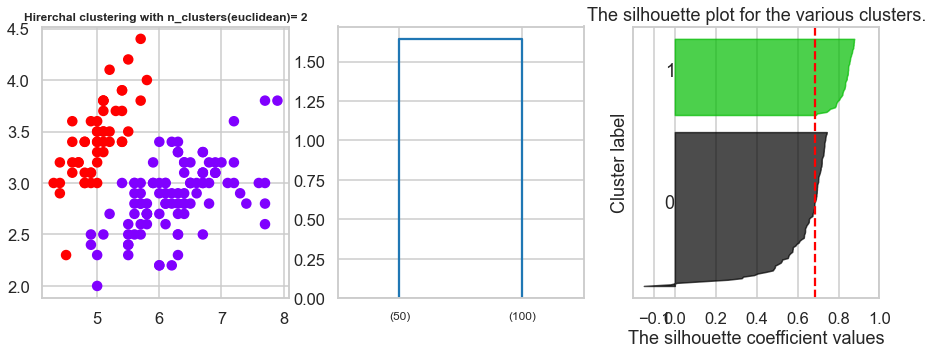

In [246]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(1,2)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='euclidean', linkage='single',distance_threshold=d)
    trained_model= cluster_e.fit_predict(iris_data.data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(iris_data.data[:,0],iris_data.data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(iris_data.data, method='single', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(iris_data.data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(iris_data.data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

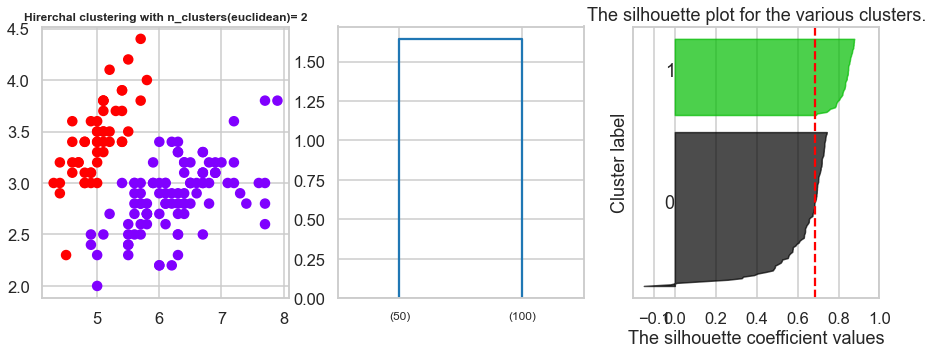

In [245]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc
from scipy.cluster.hierarchy import dendrogram, linkage

distance_threshhold = range(2,3)

s_score=[]
clustersArr=[]
for d in distance_threshhold:
    fig, (ax1,ax2,ax3) = plt.subplots(1,3)
    fig.set_size_inches(15,5)

    cluster_e = AgglomerativeClustering(n_clusters=None, affinity='manhattan', linkage='single',distance_threshold=d)
    trained_model= cluster_e.fit_predict(iris_data.data)
    n_clusters_e = 1+np.amax(cluster_e.labels_)
    clustersArr.append(n_clusters_e)
    if (n_clusters_e<2):
         print("can't apply Silhouette Score , number of clusters is less than 2")
         s_score.append(0)
    else:
        ax1.scatter(iris_data.data[:,0],iris_data.data[:,1], c=cluster_e.labels_, cmap='rainbow')
        ax1.set_title("Hirerchal clustering with n_clusters(euclidean)= %d"% n_clusters_e,fontsize=12,fontweight="bold")
        linked = linkage(iris_data.data, method='single', metric='euclidean') 
        # labelList=cluster_e.labels_

        dendrogram(linked,
                    ax=ax2,
                    truncate_mode = 'lastp', p=int(n_clusters_e),
                    labels=cluster_e.labels_,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    orientation='top')

        silhouette_avg = silhouette_score(iris_data.data, cluster_e.labels_)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(iris_data.data, cluster_e.labels_)
        n_clusters=n_clusters_e
        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_e.labels_ == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax3.fill_betweenx(
                np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle
            ax3.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax3.set_title("The silhouette plot for the various clusters.")
        ax3.set_xlabel("The silhouette coefficient values")
        ax3.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax3.axvline(x=silhouette_avg, color="red", linestyle="--")
        s_score.append(silhouette_avg)
        ax3.set_yticks([])# Clear the yaxis labels / ticks
        ax3.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

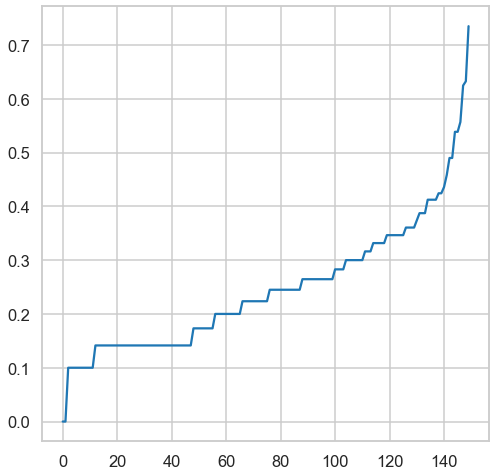

In [233]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

neighbors = NearestNeighbors(n_neighbors = 6)
neighbors_fit = neighbors.fit(iris_data.data)

distances, indices = neighbors_fit.kneighbors(iris_data.data)

distances =np.sort(distances, axis = 0)
distances = distances[:,1]
plt.plot(distances)

In [234]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
Multi_blob_data = scaler.fit_transform(iris_data.data)
max_value = [0,0,0,0]
centers = list(range(2,10))
min_samples = range(5,26)

for eps in [i/10 for i in range(1,31)]:
    for min_samples in range (5,26):
        print(f'\neps {eps}')
        print(f'\nmin samples {min_samples}')
        
        dbscan = DBSCAN(eps = eps, min_samples = min_samples).fit(iris_data.data)
        labels = dbscan.labels_
        no_clusters = len(np.unique(labels) )
        if(no_clusters<2):
            print("Can't apply Silhouette Score , number of clusters is less than 2")
        else:
            score = metrics.silhouette_score(iris_data.data,labels)
#             plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=labels,cmap='rainbow')
            print(f'Silhouette Score: {score}')
        if score > max_value[3]:
            max_value=(eps,min_samples, no_clusters, score)
print("epsilon=", max_value[0], 
      "\nmin_sample=", max_value[1],
      "\nnumber of clusters=", max_value[2],
      "\naverage silhouette score= %.4f" % max_value[3])


eps 0.1

min samples 5
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 6
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 10
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 11
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min s

Silhouette Score: 0.5283349742196707

eps 0.9

min samples 19
Silhouette Score: 0.5283349742196707

eps 0.9

min samples 20
Silhouette Score: 0.5283349742196707

eps 0.9

min samples 21
Silhouette Score: 0.5283349742196707

eps 0.9

min samples 22
Silhouette Score: 0.5283349742196707

eps 0.9

min samples 23
Silhouette Score: 0.5283349742196707

eps 0.9

min samples 24
Silhouette Score: 0.5348259441468911

eps 0.9

min samples 25
Silhouette Score: 0.5505645414075016

eps 1.0

min samples 5
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 6
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 7
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 8
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 9
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 10
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 11
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 12
Silhouette Score: 0.6867350732769776

eps 1.0

min samples 13
Silhouette Sc

Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 10
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 11
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 16
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.7

min samples 17
Can't apply S

Can't apply Silhouette Score , number of clusters is less than 2

eps 2.2

min samples 20
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.2

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.2

min samples 22
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.2

min samples 23
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.2

min samples 24
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.2

min samples 25
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.3

min samples 5
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.3

min samples 6
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.3

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.3

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.3

min samples 9
Can't apply Sil

Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 10
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 11
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 16
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 17
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.8

min samples 18
Can't apply 

Estimated no. of clusters: 2
Estimated no. of noise points: 0
Silhouette Coefficient: 0.687


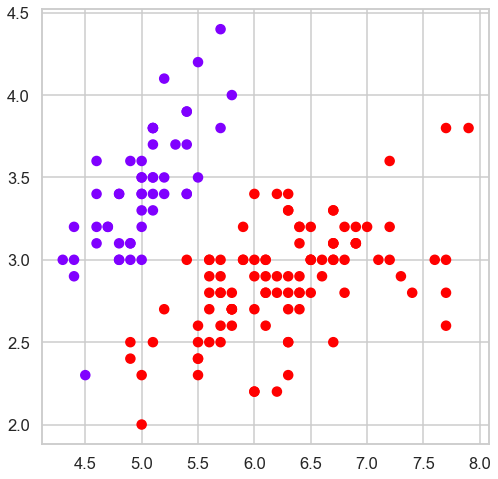

In [235]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
# Compute DBSCAN

db = DBSCAN(eps=0.9, min_samples=5).fit(iris_data.data)
clusters = db.labels_


no_clusters = len(np.unique(clusters) )
no_noise = np.sum(np.array(clusters) == -1, axis=0)

print('Estimated no. of clusters: %d' % no_clusters)
print('Estimated no. of noise points: %d' % no_noise)

# colors = ['rainbow']
# vectorizer = np.vectorize(lambda x: colors[x % len(colors)])

plt.scatter(iris_data.data[:,0], iris_data.data[:,1], c=clusters,cmap='rainbow')

#Computing "the Silhouette Score"
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(iris_data.data, clusters))

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

In [194]:
mydf= pd.read_csv("Customer data.csv")
mydf.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [241]:
mydf.drop(['ID'], axis = 1)

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...
1995,1,0,47,1,123525,0,0
1996,1,1,27,1,117744,1,0
1997,0,0,31,0,86400,0,0
1998,1,1,24,1,97968,0,0


For n_clusters = 2 The average silhouette_score is : 0.5828454744042287
epsilon= 0.9 
min_sample= 5 
number of clusters= 2 
average silhouette score= 0.6867
For n_clusters = 3 The average silhouette_score is : 0.5102874340669005
epsilon= 0.9 
min_sample= 5 
number of clusters= 2 
average silhouette score= 0.6867
For n_clusters = 4 The average silhouette_score is : 0.5410703933052678
epsilon= 0.9 
min_sample= 5 
number of clusters= 2 
average silhouette score= 0.6867
For n_clusters = 5 The average silhouette_score is : 0.5374746939140344
epsilon= 0.9 
min_sample= 5 
number of clusters= 2 
average silhouette score= 0.6867
For n_clusters = 6 The average silhouette_score is : 0.5395574222750774
epsilon= 0.9 
min_sample= 5 
number of clusters= 2 
average silhouette score= 0.6867
For n_clusters = 7 The average silhouette_score is : 0.5280796378584544
epsilon= 0.9 
min_sample= 5 
number of clusters= 2 
average silhouette score= 0.6867
For n_clusters = 8 The average silhouette_score is : 0.534

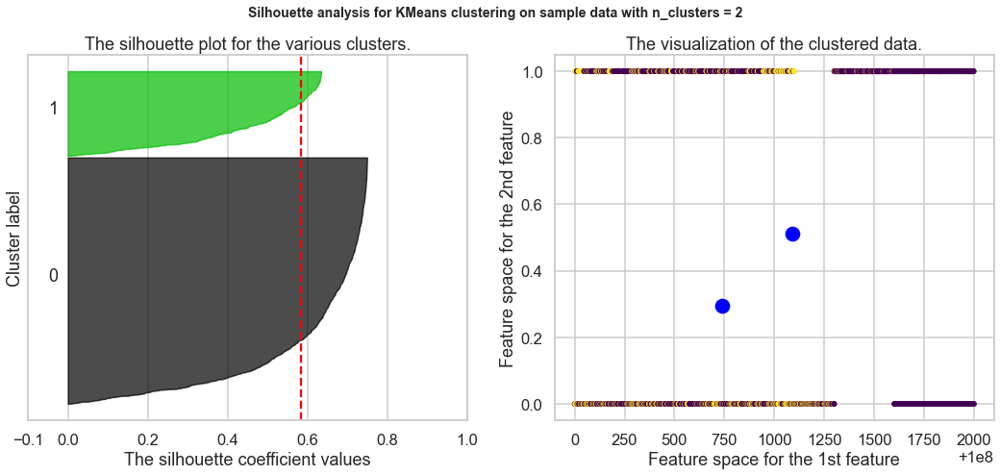

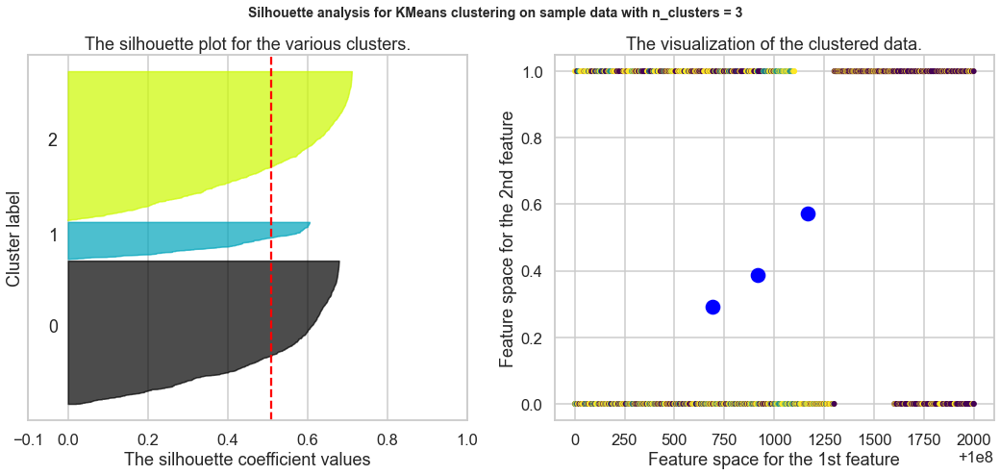

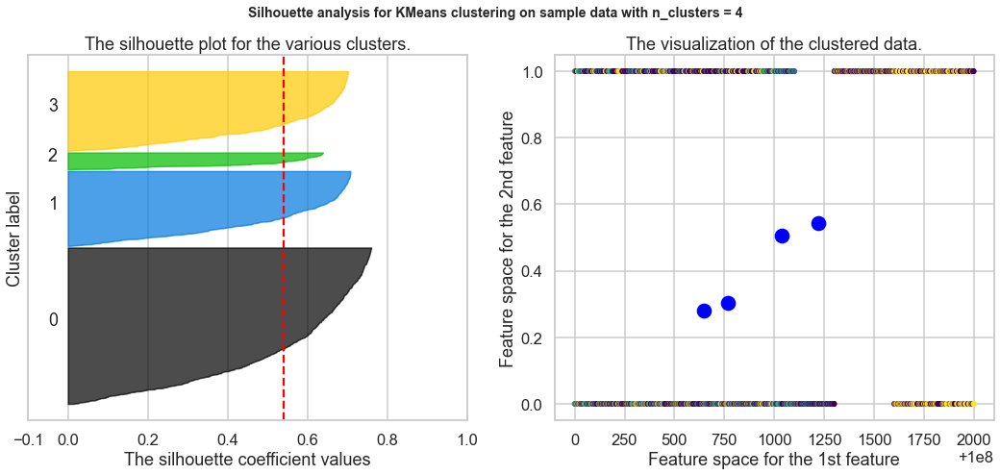

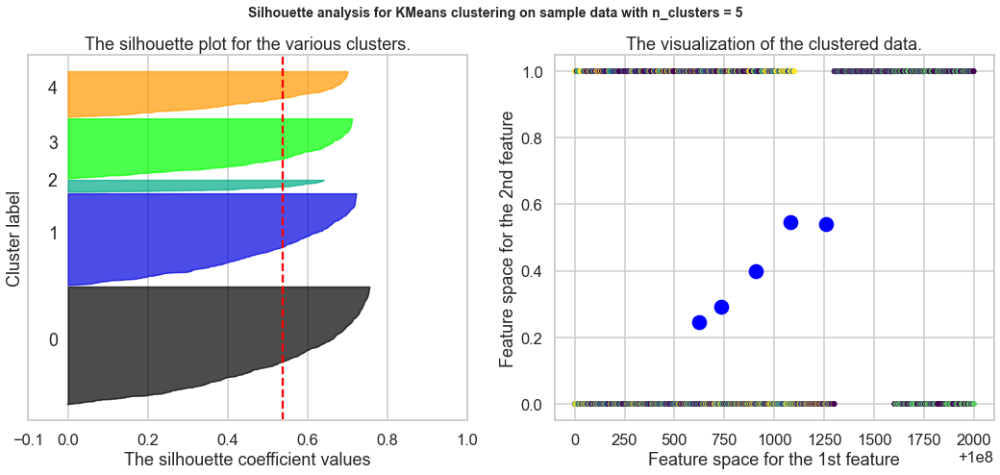

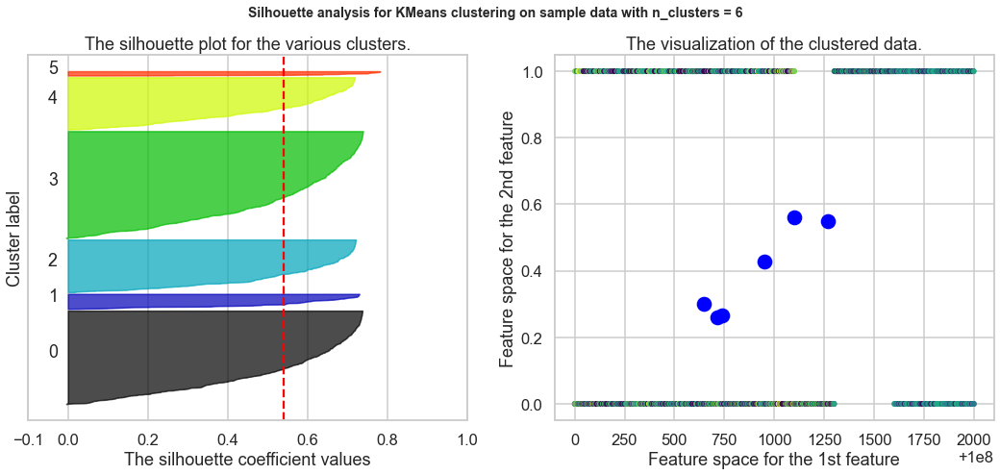

...

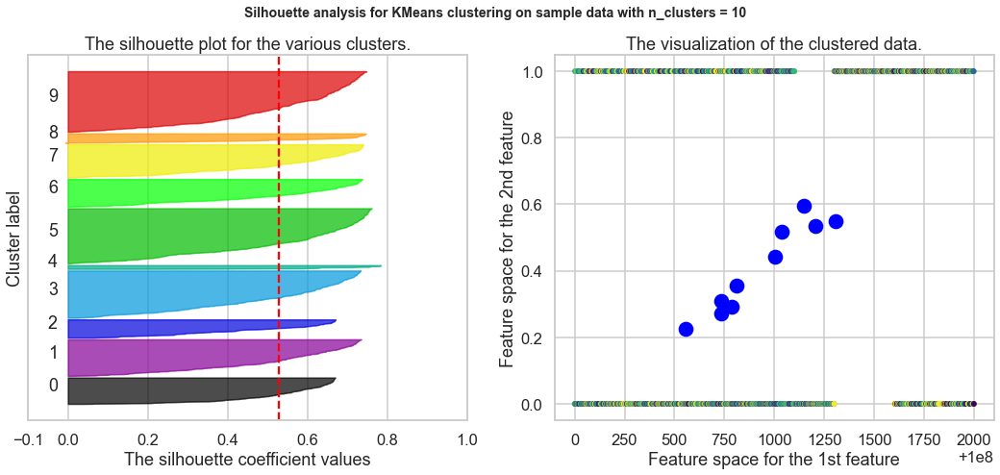

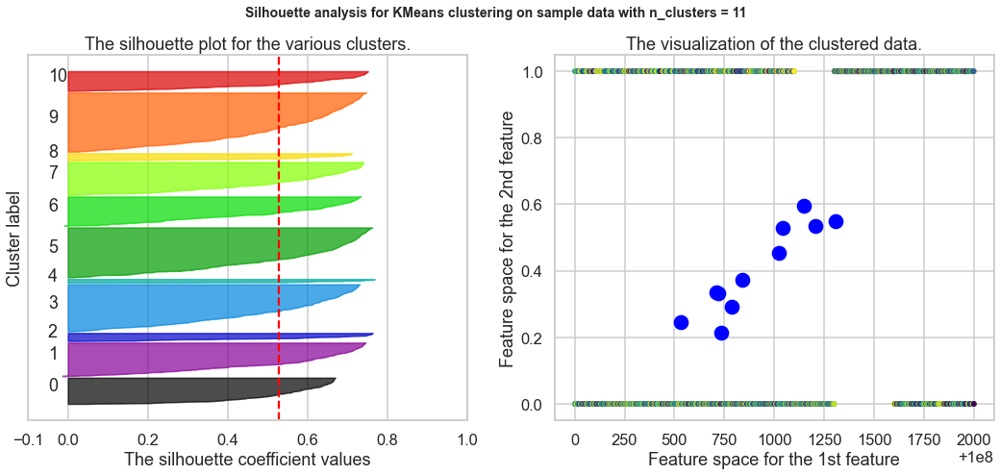

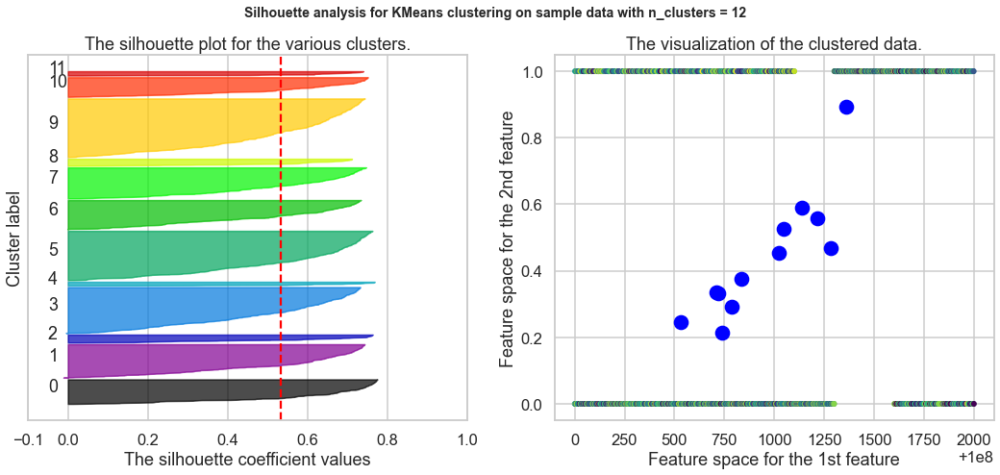

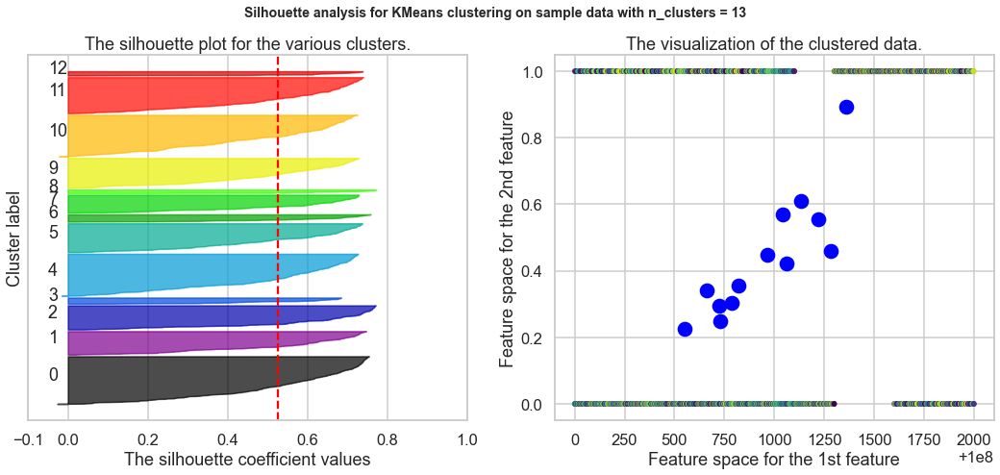

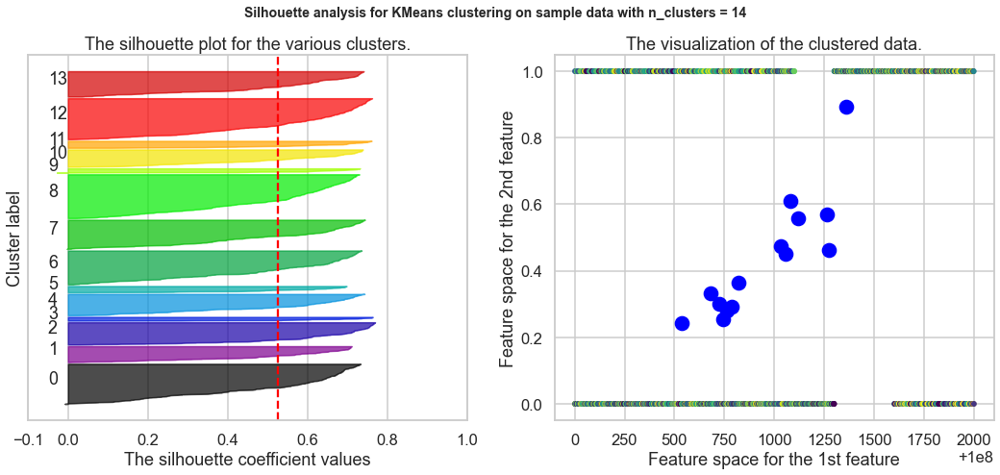

In [243]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.decomposition import PCA

range_n_clusters = range(2,15)
max = [0,0,0,0]
plot_columns=mydf.values

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18,7)
    
    
    kmeans = KMeans(n_clusters,random_state=10)
    p = kmeans.fit_predict(mydf)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(mydf, p)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(mydf, p)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[p == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper), 0,ith_cluster_silhouette_values,facecolor=color,edgecolor=color,alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])# Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    ax2.scatter(plot_columns[:,0],plot_columns[:,1], c=p, s=20, cmap='viridis')
    centers = kmeans.cluster_centers_
    ax2.scatter(centers[:,0], centers[:,1], c='blue', s=200, alpha=1);
  

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

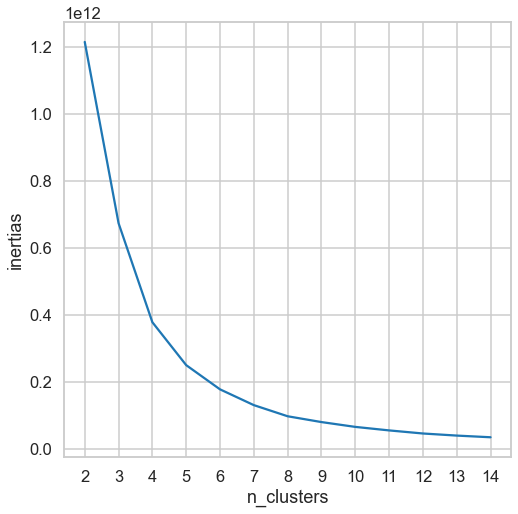

In [250]:
inertias = []
n_clusters = range(2,15)
for i in n_clusters:
    
    kmeans = KMeans(i)
    kmeans.fit(mydf.values)
    inertias.append(kmeans.inertia_)
    
elbow_plot = pd.DataFrame({'n_clusters': n_clusters, 'inertias': inertias })
sns.lineplot(x='n_clusters', y='inertias', data=elbow_plot);
plt.xticks(n_clusters);

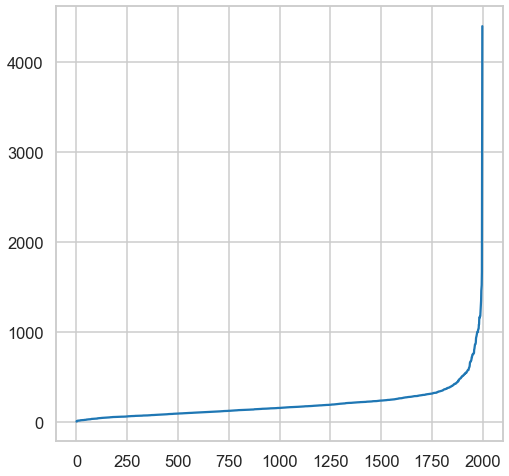

In [247]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

neighbors = NearestNeighbors(n_neighbors = 6)
neighbors_fit = neighbors.fit(mydf.values)

distances, indices = neighbors_fit.kneighbors(mydf.values)

distances =np.sort(distances, axis = 0)
distances = distances[:,1]
plt.plot(distances)

In [248]:
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
Multi_blob_data = scaler.fit_transform(mydf.values)
max_value = [0,0,0,0]
centers = list(range(2,10))
min_samples = range(5,26)

for eps in [i/10 for i in range(1,31)]:
    for min_samples in range (5,26):
        print(f'\neps {eps}')
        print(f'\nmin samples {min_samples}')
        
        dbscan = DBSCAN(eps = eps, min_samples = min_samples).fit(mydf.values)
        labels = dbscan.labels_
        no_clusters = len(np.unique(labels) )
        if(no_clusters<2):
            print("Can't apply Silhouette Score , number of clusters is less than 2")
        else:
            score = metrics.silhouette_score(mydf.values,labels)
#             plt.scatter(Multi_blob_Data[:,0], Multi_blob_Data[:,1], c=labels,cmap='rainbow')
            print(f'Silhouette Score: {score}')
        if score > max_value[3]:
            max_value=(eps,min_samples, no_clusters, score)
print("epsilon=", max_value[0], 
      "\nmin_sample=", max_value[1],
      "\nnumber of clusters=", max_value[2],
      "\naverage silhouette score= %.4f" % max_value[3])


eps 0.1

min samples 5
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 6
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 10
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 11
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.1

min s

Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 10
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 11
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 16
Can't apply Silhouette Score , number of clusters is less than 2

eps 0.6

min samples 17
Can't apply S

Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 16
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 17
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 18
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 19
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 20
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 22
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 23
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 24
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.0

min samples 25
Can't appl

Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 16
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 17
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 18
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 19
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 20
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 1.5

min samples 22
Can't appl

Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 12
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 13
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 14
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 15
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 16
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 17
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 18
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 19
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 20
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.0

min samples 22
Can't appl

Can't apply Silhouette Score , number of clusters is less than 2

eps 2.4

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.4

min samples 22
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.4

min samples 23
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.4

min samples 24
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.4

min samples 25
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 5
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 6
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.5

min samples 10
Can't apply Sil

Can't apply Silhouette Score , number of clusters is less than 2

eps 2.9

min samples 21
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.9

min samples 22
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.9

min samples 23
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.9

min samples 24
Can't apply Silhouette Score , number of clusters is less than 2

eps 2.9

min samples 25
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 5
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 6
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 7
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 8
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 9
Can't apply Silhouette Score , number of clusters is less than 2

eps 3.0

min samples 10
Can't apply Sil